# Notebook 8 (V4.3) — One-Dimensional Parameter Sweeps for NFA and Bubble Share

This notebook follows `AI_gen_prompts/agent_prompt_v43_parameter_sweeps.md` with two deliberate deviations requested for this run:

1. use **one-dimensional** searches only, not Cartesian grids;
2. keep all tables and plots self-contained in the notebook output.

The goal is to find parameter directions that make the U.S. look like the long-run debtor while preserving a meaningful equity bubble. In particular, we track whether:

- U.S. NFA remains negative for a long part of the unbalanced path;
- the bubble component `B_US / Q_US` is quantitatively nontrivial;
- foreign demand for U.S. equity is large enough to generate the valuation/liability channel.

Two classes of experiments are reported:

- **full-equilibrium exploratory sweeps** at `T_max = 40`, used to identify NFA-sign and stability directions;
- **full-equilibrium T=100 screen sweeps**, used for the main mechanism path plots when the nonlinear solve returns; infeasible rows are reported explicitly as errors or timeout probes instead of being replaced by baseline-path accounting rows.

The baseline `T=100` replication is still run directly from `TwoCountryProductionOLG.jl`.


In [1]:
using Pkg; Pkg.activate(".")
include("TwoCountryProductionOLG.jl")

using Printf, Statistics, Plots, LaTeXStrings, Markdown
using Plots.PlotMeasures
gr()

default(size=(900, 520), framestyle=:box, grid=:y, legend=:best,
        titlefontsize=11, guidefontsize=10, tickfontsize=9, legendfontsize=8,
        left_margin=9mm, right_margin=6mm, top_margin=7mm, bottom_margin=8mm)

  Activating project at `~/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes`


## 0. Helpers

`run_case` stores the prompt's main validity metrics, NFA metrics, bubble metrics, and foreign-demand diagnostics. Failed or provisional runs are retained in the result table instead of being dropped.

In [2]:
value_at(x, t) = x[min(t, length(x))]
late_range(T) = max(1, T - 19):T

function pretty(x)
    x === missing && return ""
    x isa Bool && return string(x)
    x isa Integer && return string(x)
    if x isa AbstractFloat
        if !isfinite(x)
            return string(x)
        elseif abs(x) >= 1000 || (abs(x) > 0 && abs(x) < 1e-3)
            return @sprintf("%.3e", x)
        else
            return @sprintf("%.4f", x)
        end
    end
    return string(x)
end

function html_escape(x)
    s = string(x)
    s = replace(s, "&" => "&amp;")
    s = replace(s, "<" => "&lt;")
    s = replace(s, ">" => "&gt;")
    s = replace(s, "\"" => "&quot;")
    return s
end

function markdown_table(rows, cols; maxrows=length(rows))
    # Return HTML instead of Markdown.MD. IJulia's Markdown table display also
    # emits a LaTeX tabular representation, which the Codex/KaTeX renderer cannot parse.
    shown = rows[1:min(maxrows, length(rows))]
    buf = IOBuffer()
    println(buf, "<div style=\"max-width:100%; overflow-x:auto; margin:0.4rem 0 1rem 0;\">")
    println(buf, "<table style=\"border-collapse:collapse; font-size:12px; line-height:1.25; white-space:nowrap;\">")
    println(buf, "<thead><tr>")
    for c in cols
        println(buf, "<th style=\"border-bottom:1px solid #999; padding:4px 8px; text-align:right;\">", html_escape(c), "</th>")
    end
    println(buf, "</tr></thead><tbody>")
    for row in shown
        println(buf, "<tr>")
        for c in cols
            println(buf, "<td style=\"border-bottom:1px solid #ddd; padding:3px 8px; text-align:right;\">", html_escape(pretty(get(row, c, missing))), "</td>")
        end
        println(buf, "</tr>")
    end
    if length(rows) > length(shown)
        println(buf, "<tr><td style=\"padding:3px 8px;\">...</td>")
        for _ in 2:length(cols)
            println(buf, "<td></td>")
        end
        println(buf, "</tr>")
    end
    println(buf, "</tbody></table></div>")
    return HTML(String(take!(buf)))
end

function add_score!(row)
    if get(row, "status", "error") != "ok"
        row["score"] = -Inf
        row["channel"] = "failed"
        return row
    end

    valid_exploratory = get(row, "valid_exploratory", false) === true
    score = 0.0
    score += 3.0 * max(0.0, -row["nfa_Y_late_mean"])
    score += 2.0 * max(0.0, -row["nfa_Y_final"])
    score += 5.0 * row["bubble_share_late_mean"]
    score += 2.0 * row["bubble_share_final"]
    score += 1.0 * row["nfa_negative_share"]
    score += 1.0 * row["foreign_equity_share_late_mean"]
    !valid_exploratory && (score -= 10.0)
    row["psi_min"] < 1e-3 && (score -= 5.0)
    row["equity_weight_min"] < 1e-3 && (score -= 5.0)
    row["theta_min"] < -5.0 && (score -= 2.0)
    row["score"] = score

    if row["nfa_negative_share"] >= 0.50 && row["bubble_share_late_mean"] >= 0.05 && row["foreign_equity_share_late_mean"] > 0.20 && row["χ"] <= 0.03
        row["channel"] = "foreign-equity-boom candidate"
    elseif row["nfa_negative_share"] >= 0.50 && row["χ"] >= 0.03
        row["channel"] = "safe-asset/bond leaning"
    elseif row["bubble_share_late_mean"] >= 0.05
        row["channel"] = "bubble-share only"
    elseif row["nfa_negative_share"] >= 0.50
        row["channel"] = "NFA sign only"
    else
        row["channel"] = "weak"
    end
    return row
end

function run_case(label::String, sweep::String, value_label::String, p::ProductionParams)
    row = Dict{String, Any}(
        "label" => label,
        "sweep" => sweep,
        "value" => value_label,
        "T_max" => p.T_max,
        "β" => p.β,
        "γ" => p.γ,
        "κ" => p.κ,
        "ωbar_star" => p.ω̄_star,
        "χ" => p.χ,
        "η" => p.η,
        "π_persist" => p.π_persist,
        "a_US" => p.a_US,
        "ϑ_US" => p.ϑ_US,
        "H_W" => p.H_W,
        "L_W" => p.L_W,
        "a_W" => p.a_W,
        "ν_u" => p.ν_u,
        "ξ_u" => p.ξ_u,
        "ξ_gap" => p.ξ_u - p.ν_u,
        "ψ_US" => (p.ξ_u - p.ν_u) * (p.ρ_US - 1),
    )

    try
        elapsed = @elapsed begin
            result = run_production_simulation(p; verbose=false)
            dec = nfa_decomposition(result)
            fv = fundamental_value_path(result)
            T = length(result.u_path)
            last20 = late_range(T)

            Y_US = [s.Y_US for s in result.u_path]
            e_US = [s.e_US for s in result.u_path]
            R_A_u = [s.R_A_u for s in result.u_path]
            R_A_b = [s.R_A_b for s in result.u_path]
            R_A_star_u = [s.R_A_star_u for s in result.u_path]
            R_A_star_b = [s.R_A_star_b for s in result.u_path]
            Astar_A = [s.A_star / s.A for s in result.u_path]
            foreign_equity_share = [s.ω_star * s.S_star / s.Q_US for s in result.u_path]
            theta_path = [s.θ for s in result.u_path]
            thetaUSstar_path = [s.θ_US_star for s in result.u_path]
            nu_b_eff_path = [b.ν_b_eff for b in result.bgp_seq[1:T]]

            nfa_Y = dec.NFA ./ Y_US
            nfa_e = dec.NFA ./ e_US
            nfa_bubble_Y = dec.NFA_bubble ./ Y_US
            bubble_Y = dec.B_agg ./ Y_US
            bubble_share = dec.bubble_share
            Q_A = dec.Q_US ./ dec.A
            neg_idx = findall(<(0.0), dec.NFA)

            row["status"] = "ok"
            row["branch_converged"] = result.branch_converged
            row["max_u_residual"] = result.max_u_residual
            row["max_bgp_residual"] = result.max_bgp_residual
            row["psi_ok"] = result.diagnostics.psi_ok
            row["psi_min"] = result.diagnostics.psi_min
            row["equity_weights_ok"] = result.diagnostics.equity_weights_ok
            row["equity_weight_min"] = result.diagnostics.equity_weight_min
            row["min_R_A_u"] = minimum(R_A_u)
            row["min_R_A_b"] = minimum(R_A_b)
            row["min_R_A_star_u"] = minimum(R_A_star_u)
            row["min_R_A_star_b"] = minimum(R_A_star_b)

            row["valid_core"] = result.branch_converged && result.max_u_residual <= 1e-5 &&
                                  result.max_bgp_residual <= 1e-5 &&
                                  result.diagnostics.psi_ok && result.diagnostics.equity_weights_ok &&
                                  minimum(R_A_u) > 0 && minimum(R_A_b) > 0
            row["valid_exploratory"] = result.max_u_residual <= 1e-4 &&
                                         result.diagnostics.psi_ok && result.diagnostics.equity_weights_ok &&
                                         minimum(R_A_u) > 0 && minimum(R_A_b) > 0

            for tt in (1, 20, 40, 60, 80, 100)
                row["nfa_Y_t$(tt)"] = nfa_Y[min(tt, T)]
                row["bubble_share_t$(tt)"] = bubble_share[min(tt, T)]
            end
            row["nfa_Y_final"] = nfa_Y[end]
            row["nfa_Y_min"] = minimum(nfa_Y)
            row["nfa_Y_late_mean"] = mean(nfa_Y[last20])
            row["nfa_e_final"] = nfa_e[end]
            row["nfa_negative_count"] = length(neg_idx)
            row["nfa_negative_share"] = length(neg_idx) / T
            row["last_negative_t"] = isempty(neg_idx) ? 0 : maximum(neg_idx)
            row["Q_A_final"] = Q_A[end]
            row["Q_A_late_mean"] = mean(Q_A[last20])

            row["bubble_share_final"] = bubble_share[end]
            row["bubble_share_max"] = maximum(bubble_share)
            row["bubble_share_late_mean"] = mean(bubble_share[last20])
            row["bubble_Y_final"] = bubble_Y[end]
            row["bubble_Y_max"] = maximum(bubble_Y)
            row["bubble_Y_late_mean"] = mean(bubble_Y[last20])

            if !isempty(neg_idx)
                contribution = (-dec.NFA_bubble[neg_idx]) ./ abs.(dec.NFA[neg_idx])
                row["bubble_contribution_mean_when_NFA_negative"] = mean(contribution)
                row["bubble_contribution_median_when_NFA_negative"] = median(contribution)
                row["bubble_contribution_final_if_NFA_negative"] = dec.NFA[end] < 0 ? (-dec.NFA_bubble[end]) / abs(dec.NFA[end]) : missing
            else
                row["bubble_contribution_mean_when_NFA_negative"] = missing
                row["bubble_contribution_median_when_NFA_negative"] = missing
                row["bubble_contribution_final_if_NFA_negative"] = missing
            end

            row["foreign_equity_share_final"] = foreign_equity_share[end]
            row["foreign_equity_share_late_mean"] = mean(foreign_equity_share[last20])
            row["Astar_A_final"] = Astar_A[end]
            row["Astar_A_late_mean"] = mean(Astar_A[last20])
            row["theta_final"] = theta_path[end]
            row["theta_min"] = minimum(theta_path)
            row["thetaUSstar_final"] = thetaUSstar_path[end]
            row["thetaUSstar_max"] = maximum(thetaUSstar_path)

            row["cond_1a_final"] = result.diagnostics.cond_1a[end]
            row["cond_1b_final"] = result.diagnostics.cond_1b[end]
            row["ratio_1a"] = result.diagnostics.ratio_1a
            row["ratio_1b"] = result.diagnostics.ratio_1b
            row["sum_inf_1a"] = result.diagnostics.sum_inf_1a
            row["sum_inf_1b"] = result.diagnostics.sum_inf_1b
            row["geom_1a_converges"] = result.diagnostics.geom_1a_converges
            row["geom_1b_converges"] = result.diagnostics.geom_1b_converges
            row["realized_ν_b_eff_mean"] = mean(nu_b_eff_path)
            row["realized_ν_b_eff_min"] = minimum(nu_b_eff_path)
            row["realized_ν_b_eff_max"] = maximum(nu_b_eff_path)
            row["realized_ν_gap"] = p.ν_u - mean(nu_b_eff_path)

            row["result"] = result
            row["dec"] = dec
            row["fv"] = fv
        end
        row["elapsed_sec"] = elapsed
    catch err
        row["status"] = "error"
        row["error"] = sprint(showerror, err)
        row["score"] = -Inf
        row["channel"] = "failed"
    end
    return add_score!(row)
end

run_case (generic function with 1 method)

## 1. Baseline Replication (`T_max=100`)

The baseline result reproduces the current issue before any sweep is interpreted.

In [3]:
base100 = run_case("baseline_T100", "baseline", "default", ProductionParams(T_max=100))

baseline_cols = ["label", "valid_core", "max_u_residual", "nfa_Y_final", "nfa_negative_count", "last_negative_t", "Q_A_final", "bubble_share_final", "bubble_Y_final", "foreign_equity_share_late_mean", "score"]
markdown_table([base100], baseline_cols)

label,valid_core,max_u_residual,nfa_Y_final,nfa_negative_count,last_negative_t,Q_A_final,bubble_share_final,bubble_Y_final,foreign_equity_share_late_mean,score
baseline_T100,true,5.118e-08,0.2031,11,11,0.6132,0.0074,0.0024,0.0073,0.1399


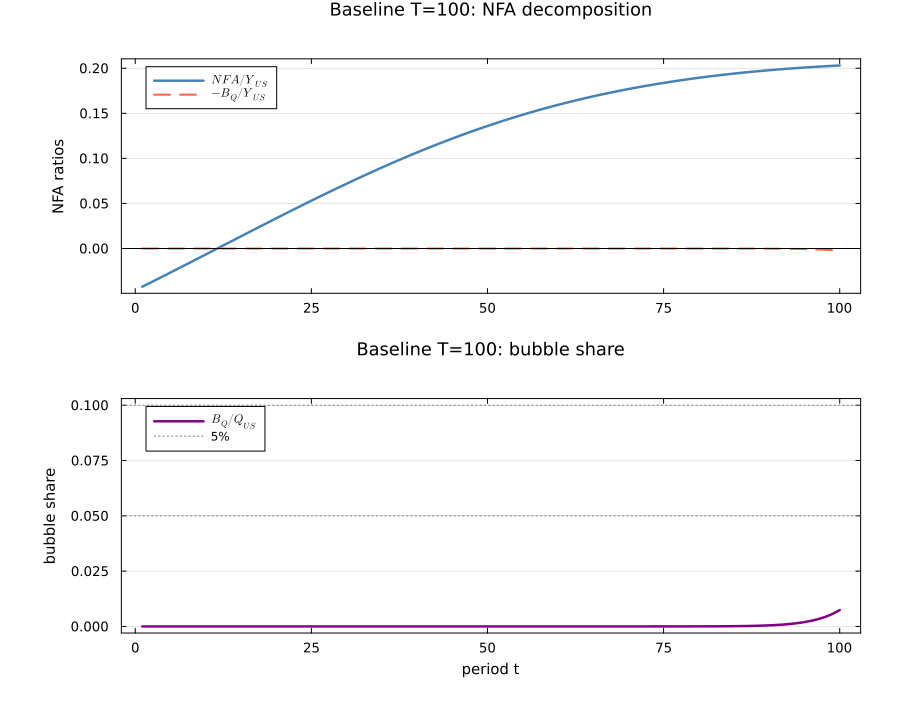

In [4]:
base_result = base100["result"]
base_dec = base100["dec"]
base_fv = base100["fv"]
base_T = length(base_result.u_path)
base_tt = 1:base_T
base_Y = [s.Y_US for s in base_result.u_path]

p_nfa = plot(base_tt, base_dec.NFA ./ base_Y,
             lw=2.5, lc=:steelblue, label=L"NFA/Y_{US}",
             ylabel="NFA ratios", title="Baseline T=100: NFA decomposition",
             legend=:topleft, titlefontsize=12,
             left_margin=12mm, right_margin=8mm, top_margin=8mm, bottom_margin=4mm)
plot!(p_nfa, base_tt, base_dec.NFA_bubble ./ base_Y,
      lw=2, ls=:dash, lc=:tomato, label=L"-B_Q/Y_{US}")
hline!(p_nfa, [0.0], lc=:black, lw=1, label="")

p_bubble = plot(base_tt, base_fv.bubble_share,
                lw=2.5, lc=:purple, label=L"B_Q/Q_{US}",
                xlabel="period t", ylabel="bubble share",
                title="Baseline T=100: bubble share",
                legend=:topleft, titlefontsize=12,
                left_margin=12mm, right_margin=8mm, top_margin=8mm, bottom_margin=10mm)
hline!(p_bubble, [0.05, 0.10], lc=[:gray :black], ls=[:dot :dot], label=["5%" "10%"])

plot(p_nfa, p_bubble, layout=(2,1), size=(900, 720), margin=8mm)


## 2. Full-Equilibrium One-Dimensional Sweeps (`T_max=40`)

These are actual equilibrium solves. `T_max=40` is used as an exploratory horizon because it keeps one-at-a-time searches fast and avoids blocking on hard high-persistence or altered-production cases. The validity columns should be checked before interpreting any row.

Included sweeps:

- `a_US` downward: market-cap/NFA sign channel suggested by the identity `Q_US = G_N w_H/a_US`;
- `vartheta_US` upward: higher price / lower dividend-yield channel;
- `gamma` downward: bubble-theorem switch-leakage channel;
- pure RoW size `m_W` with `a_W*H_W` held fixed;
- `omegastar` target demand;
- moderate `chi` bond-convenience amplifier;
- `xi_u` and `nu_u` exponent-gap diagnostics.

In [5]:
SWEEP_T = 40
sweep_cases = Tuple{String,String,String,ProductionParams}[]

for a in [0.20, 0.18, 0.15, 0.12, 0.10]
    push!(sweep_cases, ("a_US=$(a)", "a_US", @sprintf("%.2f", a), ProductionParams(T_max=SWEEP_T, a_US=a)))
end
for th in [0.50, 0.60, 0.70, 0.80]
    push!(sweep_cases, ("theta_US=$(th)", "vartheta_US", @sprintf("%.2f", th), ProductionParams(T_max=SWEEP_T, ϑ_US=th)))
end
for gam in [0.50, 0.30, 0.20, 0.10]
    push!(sweep_cases, ("gamma=$(gam)", "gamma", @sprintf("%.2f", gam), ProductionParams(T_max=SWEEP_T, γ=gam)))
end
for mW in [1.0, 2.0, 4.0, 5.0, 8.0, 10.0, 15.0, 20.0]
    push!(sweep_cases, ("mW_pure=$(mW)", "mW_pure", @sprintf("%.1f", mW), ProductionParams(T_max=SWEEP_T, H_W=mW, L_W=mW, a_W=0.20/mW)))
end
for om in [0.20, 0.30, 0.40, 0.50, 0.60]
    push!(sweep_cases, ("omegastar=$(om)", "omegastar", @sprintf("%.2f", om), ProductionParams(T_max=SWEEP_T, ω̄_star=om)))
end
for chi in [0.005, 0.010, 0.020]
    push!(sweep_cases, ("chi=$(chi)", "chi", @sprintf("%.3f", chi), ProductionParams(T_max=SWEEP_T, χ=chi)))
end
for xi in [0.70, 0.90, 1.10]
    push!(sweep_cases, ("xi_u=$(xi)", "xi_u", @sprintf("%.2f", xi), ProductionParams(T_max=SWEEP_T, ξ_u=xi)))
end
for nu in [0.20, 0.30, 0.40]
    xi = nu + 0.50
    push!(sweep_cases, ("nu_u=$(nu),xi_gap=.50", "nu_u_gap", @sprintf("%.2f", nu), ProductionParams(T_max=SWEEP_T, ν_u=nu, ξ_u=xi)))
end

sweep_rows = Dict{String,Any}[]
for (label, sweep, value_label, p) in sweep_cases
    @printf("running %-24s ...\n", label)
    push!(sweep_rows, run_case(label, sweep, value_label, p))
end

println("Completed ", length(sweep_rows), " one-dimensional full-equilibrium cases.")

running a_US=0.2                 ...
running a_US=0.18                ...
running a_US=0.15                ...
running a_US=0.12                ...
running a_US=0.1                 ...
running theta_US=0.5             ...
running theta_US=0.6             ...
running theta_US=0.7             ...
running theta_US=0.8             ...
running gamma=0.5                ...
running gamma=0.3                ...
running gamma=0.2                ...
running gamma=0.1                ...
running mW_pure=1.0              ...
running mW_pure=2.0              ...
running mW_pure=4.0              ...
running mW_pure=5.0              ...
running mW_pure=8.0              ...
running mW_pure=10.0             ...
running mW_pure=15.0             ...
running mW_pure=20.0             ...
running omegastar=0.2            ...
running omegastar=0.3            ...
running omegastar=0.4            ...
running omegastar=0.5            ...
running omegastar=0.6            ...
running chi=0.005                ...
r

In [6]:
summary_cols = ["sweep", "value", "valid_core", "valid_exploratory", "max_u_residual", "nfa_Y_final", "nfa_Y_late_mean", "nfa_negative_share", "last_negative_t", "Q_A_final", "bubble_share_final", "bubble_share_late_mean", "foreign_equity_share_late_mean", "psi_min", "equity_weight_min", "score", "channel"]
markdown_table(sweep_rows, summary_cols; maxrows=length(sweep_rows))

sweep,value,valid_core,valid_exploratory,max_u_residual,nfa_Y_final,nfa_Y_late_mean,nfa_negative_share,last_negative_t,Q_A_final,bubble_share_final,bubble_share_late_mean,foreign_equity_share_late_mean,psi_min,equity_weight_min,score,channel
a_US,0.20,true,true,6.716e-07,0.1067,0.0731,0.2750,11,0.7918,0.0085,0.0012,0.0304,0.9877,0.1341,0.3285,weak
a_US,0.18,true,true,4.685e-07,0.0718,0.0424,0.4250,17,0.8587,0.0057,8.014e-04,0.0281,0.9883,0.1563,0.4684,weak
a_US,0.15,true,true,2.993e-07,0.0134,-0.0069,0.8250,33,0.9733,0.0019,2.626e-04,0.0262,0.9890,0.1754,0.8769,NFA sign only
a_US,0.12,true,true,1.749e-07,-0.0527,-0.0591,1.0000,40,1.1072,-0.0019,-2.579e-04,0.0302,0.9896,0.1781,1.3080,NFA sign only
a_US,0.10,true,true,1.225e-07,-0.1044,-0.0965,1.0000,40,1.2154,-0.0055,-7.629e-04,0.0362,0.9899,0.1794,1.5197,NFA sign only
vartheta_US,0.50,true,true,6.716e-07,0.1067,0.0731,0.2750,11,0.7918,0.0085,0.0012,0.0304,0.9877,0.1341,0.3285,weak
vartheta_US,0.60,true,true,4.693e-07,0.0951,0.0699,0.1000,4,0.8142,0.0036,5.127e-04,0.0290,0.9852,0.1564,0.1388,weak
vartheta_US,0.70,true,true,3.549e-07,0.0743,0.0606,0.0000,0,0.8546,-0.0022,-3.196e-04,0.0304,0.9834,0.1573,0.0243,weak
vartheta_US,0.80,true,true,2.853e-07,0.0368,0.0414,0.0000,0,0.9278,-0.0114,-0.0017,0.0416,0.9825,0.1515,0.0105,weak
gamma,0.50,true,true,6.716e-07,0.1067,0.0731,0.2750,11,0.7918,0.0085,0.0012,0.0304,0.9877,0.1341,0.3285,weak


In [7]:
validish_rows = filter(r -> get(r, "valid_exploratory", false) === true, sweep_rows)
ranked_rows = sort(validish_rows, by = r -> get(r, "score", -Inf), rev=true)
rank_cols = ["label", "sweep", "value", "nfa_Y_final", "nfa_negative_share", "bubble_share_late_mean", "foreign_equity_share_late_mean", "score", "channel"]
markdown_table(ranked_rows, rank_cols; maxrows=12)

label,sweep,value,nfa_Y_final,nfa_negative_share,bubble_share_late_mean,foreign_equity_share_late_mean,score,channel
a_US=0.1,a_US,0.10,-0.1044,1.0000,-7.629e-04,0.0362,1.5197,NFA sign only
a_US=0.12,a_US,0.12,-0.0527,1.0000,-2.579e-04,0.0302,1.3080,NFA sign only
a_US=0.15,a_US,0.15,0.0134,0.8250,2.626e-04,0.0262,0.8769,NFA sign only
mW_pure=20.0,mW_pure,20.0,0.1820,0.4000,-4.639e-04,0.3472,0.7377,weak
mW_pure=15.0,mW_pure,15.0,0.1785,0.4000,-4.074e-04,0.2853,0.6770,weak
mW_pure=10.0,mW_pure,10.0,0.1721,0.4000,-2.984e-04,0.2154,0.6094,weak
mW_pure=8.0,mW_pure,8.0,0.1678,0.4000,-2.216e-04,0.1854,0.5809,weak
mW_pure=5.0,mW_pure,5.0,0.1572,0.3750,-1.496e-05,0.1369,0.5116,weak
mW_pure=4.0,mW_pure,4.0,0.1514,0.3750,1.067e-04,0.1186,0.4957,weak
a_US=0.18,a_US,0.18,0.0718,0.4250,8.014e-04,0.0281,0.4684,weak


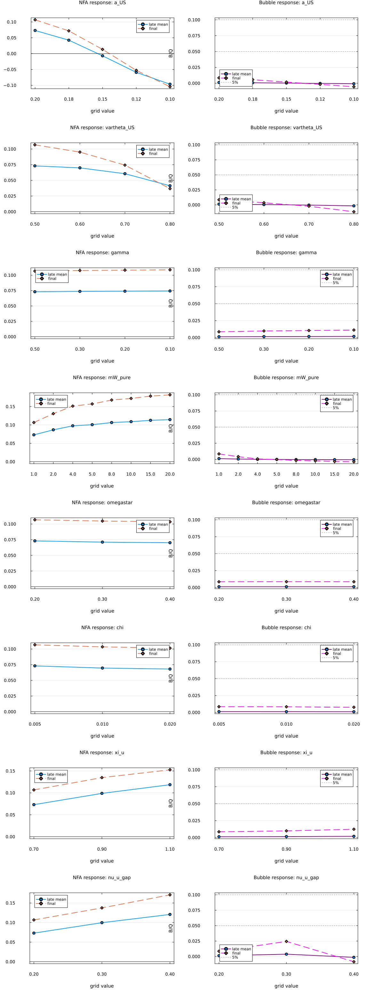

In [8]:
plot_rows = filter(r -> get(r, "status", "error") == "ok", sweep_rows)
sweep_names = unique([r["sweep"] for r in plot_rows])

plots = Any[]
for sw in sweep_names
    rows = filter(r -> r["sweep"] == sw, plot_rows)
    x = 1:length(rows)
    labels = [r["value"] for r in rows]

    p1 = plot(x, [r["nfa_Y_late_mean"] for r in rows], marker=:circle, lw=2,
              label="late mean", title="NFA response: $(sw)",
              xlabel="grid value", ylabel="NFA/Y", legend=:best,
              titlefontsize=10, left_margin=10mm, bottom_margin=9mm)
    plot!(p1, x, [r["nfa_Y_final"] for r in rows], marker=:diamond, lw=2, ls=:dash, label="final")
    hline!(p1, [0.0], lc=:black, lw=1, label="")
    xticks!(p1, x, labels)

    p2 = plot(x, [r["bubble_share_late_mean"] for r in rows], marker=:circle, lw=2, lc=:purple,
              label="late mean", title="Bubble response: $(sw)",
              xlabel="grid value", ylabel="B/Q", legend=:best,
              titlefontsize=10, left_margin=10mm, bottom_margin=9mm)
    plot!(p2, x, [r["bubble_share_final"] for r in rows], marker=:diamond, lw=2, ls=:dash, lc=:magenta, label="final")
    hline!(p2, [0.05, 0.10], lc=[:gray :black], ls=[:dot :dot], label=["5%" "10%"])
    xticks!(p2, x, labels)

    push!(plots, plot(p1, p2, layout=(1,2), size=(1150, 390), margin=7mm))
end

plot(plots..., layout=(length(plots), 1), size=(1150, 390*length(plots)), margin=8mm)


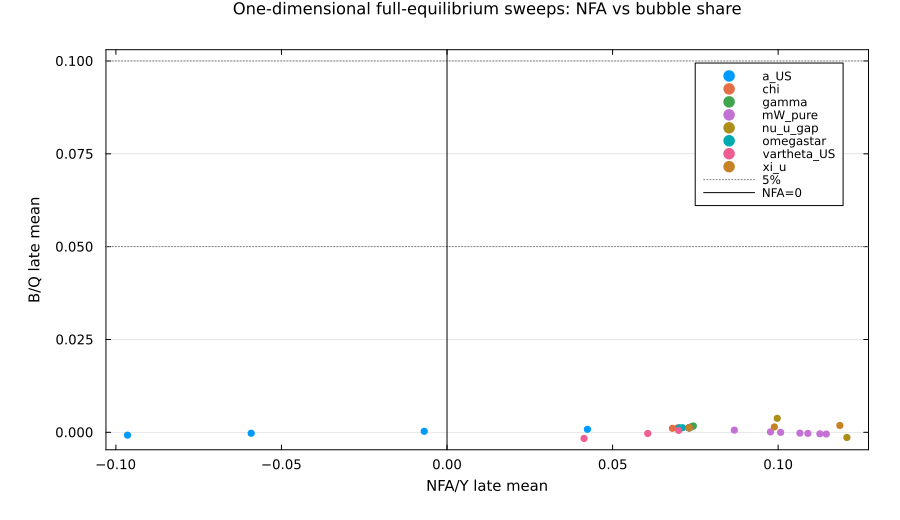

In [9]:
scatter([r["nfa_Y_late_mean"] for r in plot_rows],
        [r["bubble_share_late_mean"] for r in plot_rows],
        group=[r["sweep"] for r in plot_rows],
        markerstrokewidth=0,
        xlabel="NFA/Y late mean", ylabel="B/Q late mean",
        title="One-dimensional full-equilibrium sweeps: NFA vs bubble share")
hline!([0.05, 0.10], lc=[:gray :black], ls=[:dot :dot], label=["5%" "10%"])
vline!([0.0], lc=:black, lw=1, label="NFA=0")

### Sweep Path Plots

The next figure shows the full path for each one-dimensional sweep value. The left panel reports U.S. NFA scaled by U.S. output; the right panel reports the bubble share `B/Q_US`.

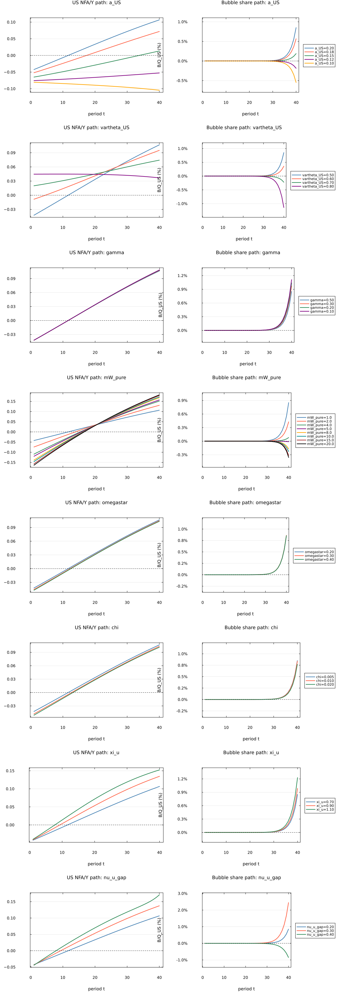

In [10]:
PATH_COLORS = [:steelblue, :tomato, :seagreen, :purple, :orange, :darkcyan, :brown, :black]
path_color(i) = PATH_COLORS[mod1(i, length(PATH_COLORS))]

percent_formatter(y) = @sprintf("%.1f%%", 100y)

function padded_limits(vals; min_span=0.012, pad_frac=0.18)
    lo = min(minimum(vals), 0.0)
    hi = max(maximum(vals), 0.0)
    span = max(hi - lo, min_span)
    mid = (lo + hi) / 2
    pad = (0.5 + pad_frac) * span
    return (mid - pad, mid + pad)
end

function sweep_path_plot(rows, sw)
    sw_rows = filter(r -> r["sweep"] == sw, rows)
    isempty(sw_rows) && return nothing

    p_nfa = plot(title="US NFA/Y path: $(sw)", xlabel="period t", ylabel="NFA/Y_US",
                 legend=false, titlefontsize=11, guidefontsize=10, tickfontsize=9,
                 left_margin=12mm, right_margin=6mm, top_margin=8mm, bottom_margin=8mm)
    p_bq = plot(title="Bubble share path: $(sw)", xlabel="period t", ylabel="B/Q_US (%)",
                legend=:outerright, titlefontsize=11, guidefontsize=10, tickfontsize=9,
                legendfontsize=8, yformatter=percent_formatter,
                left_margin=12mm, right_margin=4mm, top_margin=8mm, bottom_margin=8mm)
    all_bubble_share = Float64[]

    for (i, r) in enumerate(sw_rows)
        result = r["result"]
        dec = r["dec"]
        T = length(result.u_path)
        tt = 1:T
        Y_US = [s.Y_US for s in result.u_path]
        nfa_y = dec.NFA[1:T] ./ Y_US
        bubble_share = dec.bubble_share[1:T]
        append!(all_bubble_share, bubble_share)
        lbl = "$(sw)=$(r["value"])"
        c = path_color(i)
        plot!(p_nfa, tt, nfa_y, lw=2.2, lc=c, label=lbl)
        plot!(p_bq, tt, bubble_share, lw=2.2, lc=c, label=lbl)
    end

    hline!(p_nfa, [0.0], lc=:black, lw=1, ls=:dot, label="")
    bq_lims = padded_limits(all_bubble_share)
    ylims!(p_bq, bq_lims...)
    hline!(p_bq, [0.0], lc=:black, lw=1, ls=:dot, label="")
    bq_lims[1] <= 0.05 <= bq_lims[2] && hline!(p_bq, [0.05], lc=:gray, lw=1, ls=:dot, label="5%")
    bq_lims[1] <= 0.10 <= bq_lims[2] && hline!(p_bq, [0.10], lc=:black, lw=1, ls=:dot, label="10%")
    return plot(p_nfa, p_bq, layout=(1,2), size=(1180, 430), margin=8mm)
end

path_plots = [sweep_path_plot(plot_rows, sw) for sw in sweep_names]
path_plots = filter(p -> !isnothing(p), path_plots)
plot(path_plots..., layout=(length(path_plots), 1), size=(1180, 430 * length(path_plots)), margin=8mm)

## 3. T=100 Full-Equilibrium Mechanism Screens

These screens re-solve the nonlinear equilibrium path at each grid value before plotting paths or decomposition terms. This avoids mixing labels from a counterfactual parameter with state paths solved under the baseline calibration.

- `a_US` screen: re-solves `ProductionParams(T_max=100, a_US=value)` for feasible rows. Very low `a_US` cases can be slow or fail, so unresolved rows are kept in the summary table and omitted from path plots.
- `vartheta_US` screen: re-solves `ProductionParams(T_max=100, ϑ_US=value)`.
- `pi_persist` screen: re-solves `ProductionParams(T_max=100, π_persist=value)` when feasible. High-persistence rows are stiff at `T=100`, so they are reported as timeout/not-run rows unless explicitly moved into the solve grid.

The old baseline-path accounting/kernel calculations were useful diagnostics, but they should not be used for calibration path plots.


In [11]:
const SCREEN_T = 100
const A_SCREEN_GRID = [0.20, 0.15, 0.12, 0.10, 0.08]
const THETA_SCREEN_GRID = [0.50, 0.60, 0.70, 0.80]
const PI_SCREEN_GRID = [0.70, 0.85, 0.90, 0.95, 0.98, 0.99]

# Bounded probes showed the low-a and high-persistence cases below are not
# practical T=100 screen rows in this notebook pass. They are reported instead
# of being filled with baseline-path accounting paths.
const A_SCREEN_SOLVE_GRID = [0.20, 0.15, 0.12]
const A_SCREEN_TIMEOUT_GRID = [0.10, 0.08]
const PI_SCREEN_SOLVE_GRID = [0.70]
const PI_SCREEN_TIMEOUT_GRID = [0.85, 0.90, 0.95, 0.98, 0.99]

function screen_valid_core(result)
    R_A_u = [s.R_A_u for s in result.u_path]
    R_A_b = [s.R_A_b for s in result.u_path]
    return result.branch_converged && result.max_u_residual <= 1e-5 &&
           result.max_bgp_residual <= 1e-5 &&
           result.diagnostics.psi_ok && result.diagnostics.equity_weights_ok &&
           minimum(R_A_u) > 0 && minimum(R_A_b) > 0
end

function screen_valid_exploratory(result)
    R_A_u = [s.R_A_u for s in result.u_path]
    R_A_b = [s.R_A_b for s in result.u_path]
    return result.max_u_residual <= 1e-4 &&
           result.diagnostics.psi_ok && result.diagnostics.equity_weights_ok &&
           minimum(R_A_u) > 0 && minimum(R_A_b) > 0
end

function resolved_screen_row(screen::String, value, result)
    p = result.params
    dec = nfa_decomposition(result)
    fv = fundamental_value_path(result)
    T = length(result.u_path)
    last20 = late_range(T)

    e_US = [s.e_US for s in result.u_path]
    Q_e = dec.Q_US[1:T] ./ e_US
    nfa_e = dec.NFA[1:T] ./ e_US
    nfa_bubble_e = .-fv.B_agg[1:T] ./ e_US
    bubble_e = fv.B_agg[1:T] ./ e_US
    bubble_share = fv.bubble_share[1:T]

    Q_us_demand_e = [s.ω * s.S / s.e_US for s in result.u_path]
    Q_row_demand_e = [s.ω_star * s.S_star / s.e_US for s in result.u_path]
    wH_US = [s.q_US * p.a_US * s.N_US for s in result.u_path]
    Q_wage_cap_e = [(wH_US[t] / p.a_US) / e_US[t] for t in 1:T]
    Q_innovation_cap_e = [((1 - result.u_path[t].φ_US) * p.H_US * wH_US[t]) / e_US[t] for t in 1:T]
    d_q = [p.a_US * (1 - p.ϑ_US) / p.ϑ_US * s.φ_US * p.H_US for s in result.u_path]

    neg_idx = findall(<(0.0), nfa_e)
    return Dict{String, Any}(
        "screen" => screen,
        "sweep" => screen,
        "value" => value,
        "T_max" => p.T_max,
        "status" => "ok",
        "valid_core" => screen_valid_core(result),
        "valid_exploratory" => screen_valid_exploratory(result),
        "branch_converged" => result.branch_converged,
        "max_u_residual" => result.max_u_residual,
        "max_bgp_residual" => result.max_bgp_residual,
        "psi_ok" => result.diagnostics.psi_ok,
        "equity_weights_ok" => result.diagnostics.equity_weights_ok,
        "Q_e_final" => Q_e[end],
        "Q_e_late_mean" => mean(Q_e[last20]),
        "NFA_e_final" => nfa_e[end],
        "NFA_negative_share" => count(<(0), nfa_e) / T,
        "last_negative_t" => isempty(neg_idx) ? 0 : maximum(neg_idx),
        "d_q_final" => d_q[end],
        "bubble_share_t40" => bubble_share[min(40, T)],
        "bubble_share_t80" => bubble_share[min(80, T)],
        "bubble_share_final" => bubble_share[end],
        "bubble_share_late_mean" => mean(bubble_share[last20]),
        "bubble_e_final" => bubble_e[end],
        "Q_demand_add_err_max" => maximum(abs.(Q_e .- Q_us_demand_e .- Q_row_demand_e)),
        "Q_prod_add_err_max" => maximum(abs.(Q_e .- Q_wage_cap_e .- Q_innovation_cap_e)),
        "nfa_e_path" => nfa_e,
        "nfa_bubble_e_path" => nfa_bubble_e,
        "Q_e_path" => Q_e,
        "Q_us_demand_e_path" => Q_us_demand_e,
        "Q_row_demand_e_path" => Q_row_demand_e,
        "Q_wage_cap_e_path" => Q_wage_cap_e,
        "Q_innovation_cap_e_path" => Q_innovation_cap_e,
        "varphi_US_path" => [s.φ_US for s in result.u_path],
        "wH_e_path" => wH_US ./ e_US,
        "bubble_share_path" => bubble_share,
        "bubble_e_path" => bubble_e,
        "result" => result,
        "dec" => dec,
        "fv" => fv,
    )
end

function screen_failure_row(screen::String, value, status::String, reason::String; T_max::Int=SCREEN_T)
    return Dict{String, Any}(
        "screen" => screen,
        "sweep" => screen,
        "value" => value,
        "T_max" => T_max,
        "status" => status,
        "valid_core" => missing,
        "valid_exploratory" => missing,
        "branch_converged" => missing,
        "max_u_residual" => missing,
        "max_bgp_residual" => missing,
        "Q_e_final" => missing,
        "Q_e_late_mean" => missing,
        "NFA_e_final" => missing,
        "NFA_negative_share" => missing,
        "last_negative_t" => missing,
        "d_q_final" => missing,
        "bubble_share_t40" => missing,
        "bubble_share_t80" => missing,
        "bubble_share_final" => missing,
        "bubble_share_late_mean" => missing,
        "bubble_e_final" => missing,
        "Q_demand_add_err_max" => missing,
        "Q_prod_add_err_max" => missing,
        "elapsed_sec" => missing,
        "error" => reason,
        "nfa_e_path" => Float64[],
        "nfa_bubble_e_path" => Float64[],
        "Q_e_path" => Float64[],
        "Q_us_demand_e_path" => Float64[],
        "Q_row_demand_e_path" => Float64[],
        "Q_wage_cap_e_path" => Float64[],
        "Q_innovation_cap_e_path" => Float64[],
        "varphi_US_path" => Float64[],
        "wH_e_path" => Float64[],
        "bubble_share_path" => Float64[],
        "bubble_e_path" => Float64[],
    )
end

function run_resolved_screen_case(screen::String, value, p::ProductionParams)
    try
        row = nothing
        elapsed = @elapsed begin
            result = run_production_simulation(p; verbose=false)
            row = resolved_screen_row(screen, value, result)
        end
        row["elapsed_sec"] = elapsed
        row["error"] = ""
        return row
    catch err
        row = screen_failure_row(screen, value, "error", sprint(showerror, err); T_max=p.T_max)
        row["elapsed_sec"] = missing
        return row
    end
end

function screen_timeout_row(screen::String, value, reason::String)
    return screen_failure_row(screen, value, "timeout_probe", reason; T_max=SCREEN_T)
end

function run_resolved_screen_sweeps()
    a_rows = Dict{String, Any}[]
    for a in A_SCREEN_SOLVE_GRID
        @printf("running full-equilibrium a_US=%.2f, T=%d\n", a, SCREEN_T)
        push!(a_rows, run_resolved_screen_case("a_US full equilibrium", a,
                                                ProductionParams(T_max=SCREEN_T, a_US=a)))
    end
    for a in A_SCREEN_TIMEOUT_GRID
        push!(a_rows, screen_timeout_row("a_US full equilibrium", a, "T=100 probe timeout > 90s"))
    end

    th_rows = Dict{String, Any}[]
    for th in THETA_SCREEN_GRID
        @printf("running full-equilibrium vartheta_US=%.2f, T=%d\n", th, SCREEN_T)
        push!(th_rows, run_resolved_screen_case("vartheta_US full equilibrium", th,
                                                 ProductionParams(T_max=SCREEN_T, ϑ_US=th)))
    end

    pi_rows = Dict{String, Any}[]
    for pi in PI_SCREEN_SOLVE_GRID
        @printf("running full-equilibrium pi_persist=%.2f, T=%d\n", pi, SCREEN_T)
        push!(pi_rows, run_resolved_screen_case("pi_persist full equilibrium", pi,
                                                 ProductionParams(T_max=SCREEN_T, π_persist=pi)))
    end
    for pi in PI_SCREEN_TIMEOUT_GRID
        reason = pi <= 0.90 ? "T=100 probe timeout > 90s" :
                 "not run; higher-persistence T=100 probes skipped after 0.85 and 0.90 timeouts"
        push!(pi_rows, screen_timeout_row("pi_persist full equilibrium", pi, reason))
    end

    return a_rows, th_rows, pi_rows
end

a_rows, th_rows, pi_rows = run_resolved_screen_sweeps()
a_rows_ok = filter(r -> get(r, "status", "") == "ok" && haskey(r, "result"), a_rows)
th_rows_ok = filter(r -> get(r, "status", "") == "ok" && haskey(r, "result"), th_rows)
pi_rows_ok = filter(r -> get(r, "status", "") == "ok" && haskey(r, "result"), pi_rows)

screen_cols = ["screen", "value", "status", "valid_core", "max_u_residual", "Q_e_final", "NFA_e_final", "NFA_negative_share", "last_negative_t", "d_q_final", "elapsed_sec", "error"]
markdown_table(vcat(a_rows, th_rows), screen_cols; maxrows=length(a_rows) + length(th_rows))


running full-equilibrium a_US=0.20, T=100
running full-equilibrium a_US=0.15, T=100
running full-equilibrium a_US=0.12, T=100
running full-equilibrium vartheta_US=0.50, T=100
running full-equilibrium vartheta_US=0.60, T=100
running full-equilibrium vartheta_US=0.70, T=100
running full-equilibrium vartheta_US=0.80, T=100
running full-equilibrium pi_persist=0.70, T=100


screen,value,status,valid_core,max_u_residual,Q_e_final,NFA_e_final,NFA_negative_share,last_negative_t,d_q_final,elapsed_sec,error
a_US full equilibrium,0.2000,ok,true,5.118e-08,0.3066,0.1934,0.1100,11,0.0072,34.6986,
a_US full equilibrium,0.1500,error,,,,,,,,,"DomainError with -0.5017150542378392: Exponentiation yielding a complex result requires a complex argument. Replace x^y with (x+0im)^y, Complex(x)^y, or similar."
a_US full equilibrium,0.1200,ok,true,2.439e-08,0.5431,-0.0431,1.0000,100,0.0301,79.6369,
a_US full equilibrium,0.1000,timeout_probe,,,,,,,,,T=100 probe timeout > 90s
a_US full equilibrium,0.0800,timeout_probe,,,,,,,,,T=100 probe timeout > 90s
vartheta_US full equilibrium,0.5000,ok,true,5.118e-08,0.3066,0.1934,0.1100,11,0.0072,35.1866,
vartheta_US full equilibrium,0.6000,ok,true,1.038e-08,0.3526,0.1474,0.0400,4,0.0064,356.8832,
vartheta_US full equilibrium,0.7000,ok,true,7.441e-08,0.4375,0.0625,0.0000,0,0.0054,45.0897,
vartheta_US full equilibrium,0.8000,ok,true,1.631e-09,0.5243,-0.0243,0.3000,100,0.0044,50.8671,


In [12]:
pi_cols = ["screen", "value", "status", "valid_core", "max_u_residual", "bubble_share_t40", "bubble_share_t80", "bubble_share_final", "bubble_share_late_mean", "bubble_e_final", "elapsed_sec", "error"]
markdown_table(pi_rows, pi_cols; maxrows=length(pi_rows))


screen,value,status,valid_core,max_u_residual,bubble_share_t40,bubble_share_t80,bubble_share_final,bubble_share_late_mean,bubble_e_final,elapsed_sec,error
pi_persist full equilibrium,0.7000,ok,true,5.118e-08,-4.875e-12,2.386e-05,0.0074,0.0016,0.0023,33.7845,
pi_persist full equilibrium,0.8500,timeout_probe,,,,,,,,,T=100 probe timeout > 90s
pi_persist full equilibrium,0.9000,timeout_probe,,,,,,,,,T=100 probe timeout > 90s
pi_persist full equilibrium,0.9500,timeout_probe,,,,,,,,,not run; higher-persistence T=100 probes skipped after 0.85 and 0.90 timeouts
pi_persist full equilibrium,0.9800,timeout_probe,,,,,,,,,not run; higher-persistence T=100 probes skipped after 0.85 and 0.90 timeouts
pi_persist full equilibrium,0.9900,timeout_probe,,,,,,,,,not run; higher-persistence T=100 probes skipped after 0.85 and 0.90 timeouts


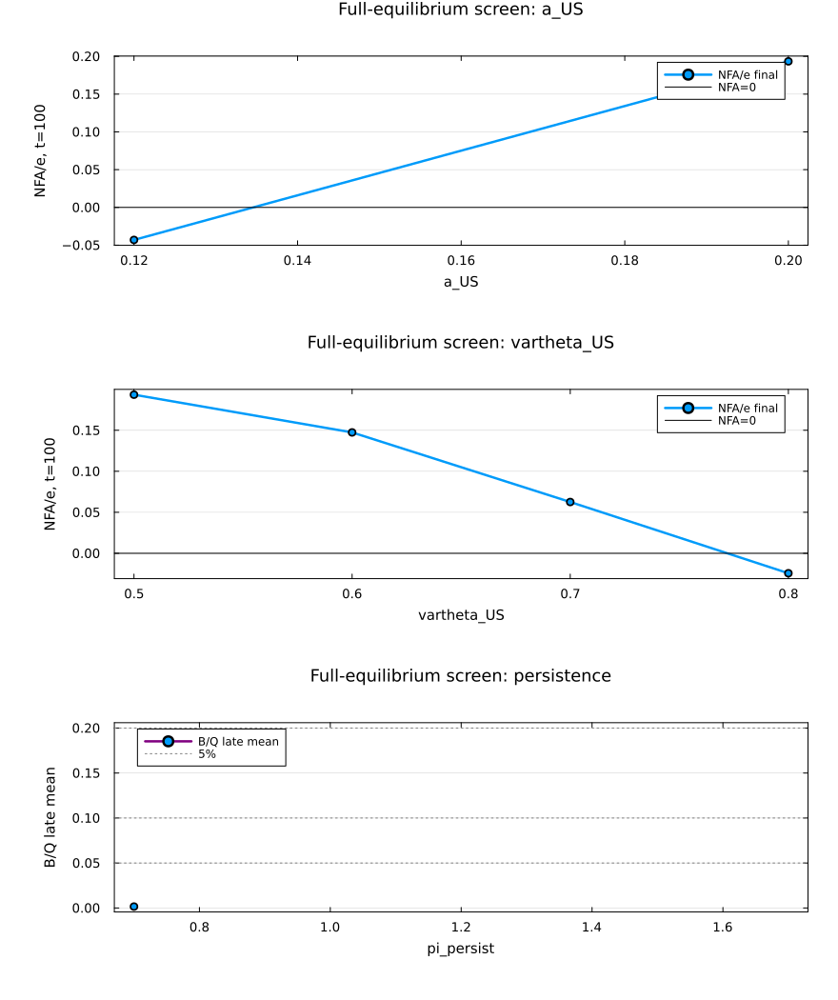

In [13]:
pa = plot([r["value"] for r in a_rows_ok], [r["NFA_e_final"] for r in a_rows_ok],
          marker=:circle, lw=2.5, xlabel="a_US", ylabel="NFA/e, t=100",
          title="Full-equilibrium screen: a_US", label="NFA/e final",
          legend=:topright, titlefontsize=12, left_margin=12mm, bottom_margin=9mm)
hline!(pa, [0.0], lc=:black, label="NFA=0")

ptheta = plot([r["value"] for r in th_rows_ok], [r["NFA_e_final"] for r in th_rows_ok],
              marker=:circle, lw=2.5, xlabel="vartheta_US", ylabel="NFA/e, t=100",
              title="Full-equilibrium screen: vartheta_US", label="NFA/e final",
              legend=:topright, titlefontsize=12, left_margin=12mm, bottom_margin=9mm)
hline!(ptheta, [0.0], lc=:black, label="NFA=0")

ppi = plot([r["value"] for r in pi_rows_ok], [r["bubble_share_late_mean"] for r in pi_rows_ok],
           marker=:circle, lw=2.5, lc=:purple, xlabel="pi_persist", ylabel="B/Q late mean",
           title="Full-equilibrium screen: persistence", label="B/Q late mean",
           legend=:topleft, titlefontsize=12, left_margin=12mm, bottom_margin=9mm)
hline!(ppi, [0.05, 0.10, 0.20], lc=[:gray :black :purple], ls=[:dot :dot :dash], label=["5%" "10%" "20%"])

plot(pa, ptheta, ppi, layout=(3,1), size=(880, 1050), margin=8mm)


### T=100 Full-Equilibrium Screen Path Plots

These plots use only rows that successfully re-solved the `T=100` equilibrium. Error and timeout rows remain in the tables above but are omitted from path plots.


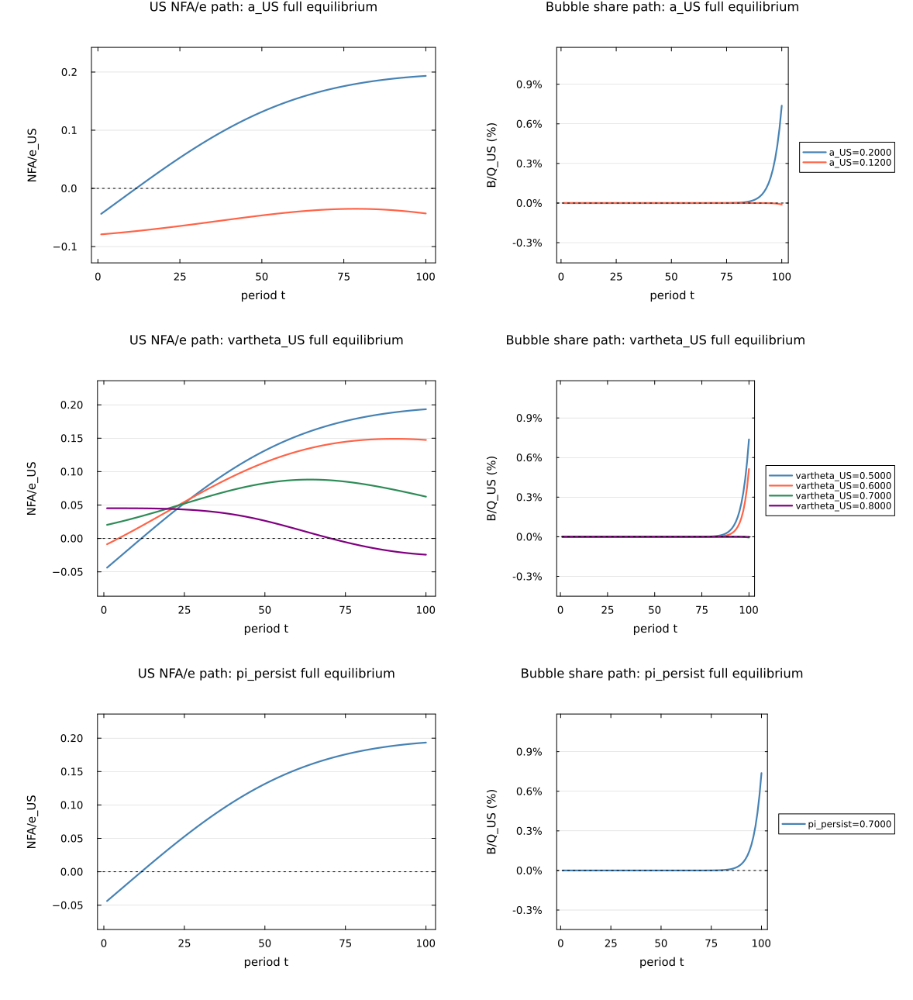

In [14]:
function screen_path_plot(rows, param_label, title_label; nfa_key="nfa_e_path", nfa_ylabel="NFA/e_US", nfa_title="US NFA/e path")
    p_nfa = plot(title="$(nfa_title): $(title_label)", xlabel="period t", ylabel=nfa_ylabel,
                 legend=false, titlefontsize=11, guidefontsize=10, tickfontsize=9,
                 left_margin=12mm, right_margin=6mm, top_margin=8mm, bottom_margin=8mm)
    p_bq = plot(title="Bubble share path: $(title_label)", xlabel="period t", ylabel="B/Q_US (%)",
                legend=:outerright, titlefontsize=11, guidefontsize=10, tickfontsize=9,
                legendfontsize=8, yformatter=percent_formatter,
                left_margin=12mm, right_margin=4mm, top_margin=8mm, bottom_margin=8mm)

    all_nfa = Float64[]
    all_bq = Float64[]
    for (i, r) in enumerate(rows)
        nfa_path = r[nfa_key]
        bubble_path = r["bubble_share_path"]
        tt = 1:length(bubble_path)
        append!(all_nfa, nfa_path)
        append!(all_bq, bubble_path)
        lbl = "$(param_label)=$(pretty(r["value"]))"
        c = path_color(i)
        plot!(p_nfa, tt, nfa_path, lw=2.2, lc=c, label=lbl)
        plot!(p_bq, tt, bubble_path, lw=2.2, lc=c, label=lbl)
    end

    ylims!(p_nfa, padded_limits(all_nfa; min_span=0.08)...)
    hline!(p_nfa, [0.0], lc=:black, lw=1, ls=:dot, label="")

    bq_lims = padded_limits(all_bq)
    ylims!(p_bq, bq_lims...)
    hline!(p_bq, [0.0], lc=:black, lw=1, ls=:dot, label="")
    bq_lims[1] <= 0.05 <= bq_lims[2] && hline!(p_bq, [0.05], lc=:gray, lw=1, ls=:dot, label="5%")
    bq_lims[1] <= 0.10 <= bq_lims[2] && hline!(p_bq, [0.10], lc=:black, lw=1, ls=:dot, label="10%")
    return plot(p_nfa, p_bq, layout=(1,2), size=(1180, 430), margin=8mm)
end

p_a_screen_path = screen_path_plot(a_rows_ok, "a_US", "a_US full equilibrium")
p_theta_screen_path = screen_path_plot(th_rows_ok, "vartheta_US", "vartheta_US full equilibrium")
p_pi_screen_path = screen_path_plot(pi_rows_ok, "pi_persist", "pi_persist full equilibrium")

plot(p_a_screen_path, p_theta_screen_path, p_pi_screen_path,
     layout=(3,1), size=(1180, 1290), margin=8mm)


### T=100 Full-Equilibrium Paths for `varphi_US` and `w_H/e_US`

Each row is one successfully re-solved screen sweep. The first column plots `varphi_US`; the second column plots `w_H/e_US`. The `Q_US/e_US` decompositions are moved to the next code block for cleaner visualization.


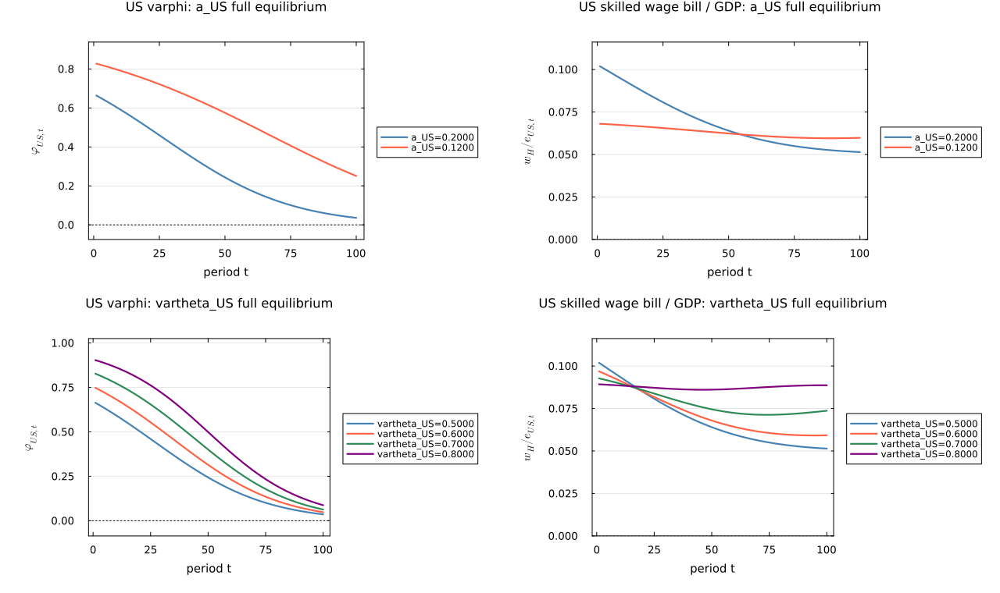

In [15]:
SCREEN_PATH_COLORS = (@isdefined PATH_COLORS) ? PATH_COLORS : [:steelblue, :tomato, :seagreen, :purple, :orange, :darkcyan, :brown, :black]
screen_path_color(i) = SCREEN_PATH_COLORS[mod1(i, length(SCREEN_PATH_COLORS))]

function padded_data_limits(vals; min_span=0.08, pad_frac=0.14, clamp_nonnegative=false)
    clean = [v for v in vals if isfinite(v)]
    isempty(clean) && return clamp_nonnegative ? (0.0, min_span) : (-min_span/2, min_span/2)
    lo = minimum(clean)
    hi = maximum(clean)
    clamp_nonnegative && (lo = min(lo, 0.0))
    span = max(hi - lo, min_span)
    pad = pad_frac * span
    ylo = lo - pad
    yhi = hi + pad
    clamp_nonnegative && (ylo = max(0.0, ylo))
    return (ylo, yhi)
end

function screen_single_path_plot(rows, param_label, title_label, path_key, ylab, plot_title;
                                 show_legend=true, min_span=0.08, clamp_nonnegative=false)
    p = plot(title="$(plot_title): $(title_label)", xlabel="period t", ylabel=ylab,
             legend=show_legend ? :outerright : false,
             titlefontsize=11, guidefontsize=10, tickfontsize=9, legendfontsize=8,
             left_margin=12mm, right_margin=show_legend ? 4mm : 6mm,
             top_margin=8mm, bottom_margin=8mm)
    all_vals = Float64[]
    for (i, r) in enumerate(rows)
        path = r[path_key]
        tt = 1:length(path)
        append!(all_vals, path)
        lbl = "$(param_label)=$(pretty(r["value"]))"
        plot!(p, tt, path, lw=2.2, lc=screen_path_color(i), label=lbl)
    end
    ylims = padded_data_limits(all_vals; min_span=min_span, clamp_nonnegative=clamp_nonnegative)
    ylims!(p, ylims...)
    ylims[1] <= 0.0 <= ylims[2] && hline!(p, [0.0], lc=:black, lw=1, ls=:dot, label="")
    return p
end

p_a_varphi_path = screen_single_path_plot(a_rows_ok, "a_US", "a_US full equilibrium",
                                          "varphi_US_path", L"\varphi_{US,t}", "US varphi")
p_a_wH_e_path = screen_single_path_plot(a_rows_ok, "a_US", "a_US full equilibrium",
                                         "wH_e_path", L"w_H/e_{US,t}", "US skilled wage bill / GDP";
                                         clamp_nonnegative=true)
p_theta_varphi_path = screen_single_path_plot(th_rows_ok, "vartheta_US", "vartheta_US full equilibrium",
                                              "varphi_US_path", L"\varphi_{US,t}", "US varphi")
p_theta_wH_e_path = screen_single_path_plot(th_rows_ok, "vartheta_US", "vartheta_US full equilibrium",
                                             "wH_e_path", L"w_H/e_{US,t}", "US skilled wage bill / GDP";
                                             clamp_nonnegative=true)

plot(p_a_varphi_path, p_a_wH_e_path,
     p_theta_varphi_path, p_theta_wH_e_path,
     layout=(2,2), size=(1280, 760), margin=8mm)


### T=100 `Q_US/e_US` Demand and Production Decomposition Paths

The first panel in each row plots total `Q_US/e_US` for successfully re-solved screen rows. The second panel plots the demand components, `omega S/e_US` and `omega^* S^*/e_US`. The third panel plots the production components, `w_H/(a_US e_US)` and `(1-varphi_US)H_US w_H/e_US`.


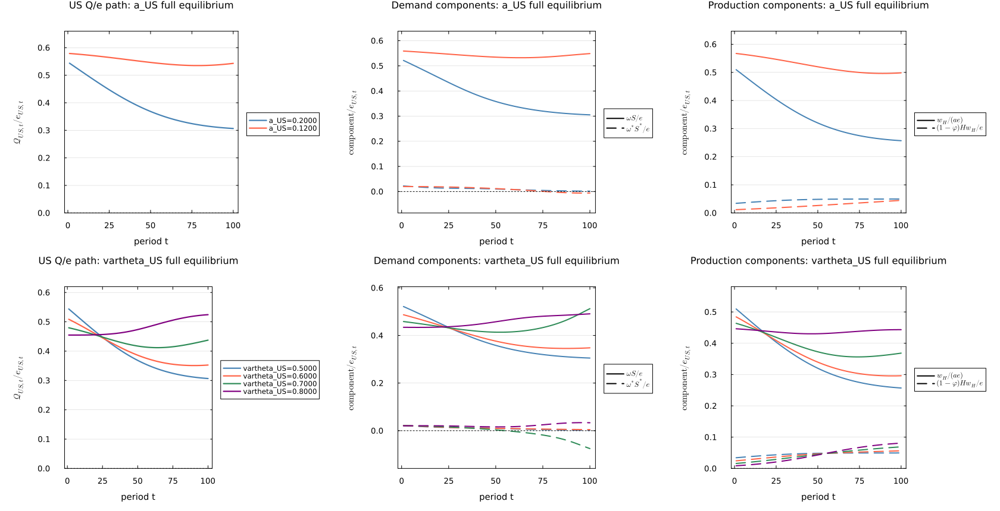

In [16]:
function screen_q_total_path_plot(rows, param_label, title_label;
                                  show_legend=true, min_span=0.08)
    p = plot(title="US Q/e path: $(title_label)", xlabel="period t",
             ylabel=L"\mathcal{Q}_{US,t}/e_{US,t}",
             legend=show_legend ? :outerright : false,
             titlefontsize=11, guidefontsize=10, tickfontsize=9, legendfontsize=8,
             left_margin=12mm, right_margin=show_legend ? 4mm : 6mm,
             top_margin=8mm, bottom_margin=8mm)

    all_vals = Float64[]
    for (i, r) in enumerate(rows)
        path = r["Q_e_path"]
        tt = 1:length(path)
        append!(all_vals, path)
        plot!(p, tt, path, lw=2.2, lc=screen_path_color(i),
              label="$(param_label)=$(pretty(r["value"]))")
    end

    ylims = padded_data_limits(all_vals; min_span=min_span, clamp_nonnegative=true)
    ylims!(p, ylims...)
    ylims[1] <= 0.0 <= ylims[2] && hline!(p, [0.0], lc=:black, lw=1, ls=:dot, label="")
    return p
end

function screen_q_demand_components_plot(rows, title_label; min_span=0.08)
    p = plot(title="Demand components: $(title_label)", xlabel="period t",
             ylabel=L"\mathrm{component}/e_{US,t}",
             legend=:outerright, titlefontsize=11, guidefontsize=10,
             tickfontsize=9, legendfontsize=8,
             left_margin=12mm, right_margin=4mm, top_margin=8mm, bottom_margin=8mm)

    all_vals = Float64[]
    for (i, r) in enumerate(rows)
        tt = 1:length(r["Q_us_demand_e_path"])
        c = screen_path_color(i)
        append!(all_vals, r["Q_us_demand_e_path"])
        append!(all_vals, r["Q_row_demand_e_path"])
        plot!(p, tt, r["Q_us_demand_e_path"], lw=2.0, lc=c, ls=:solid, label="")
        plot!(p, tt, r["Q_row_demand_e_path"], lw=2.0, lc=c, ls=:dash, label="")
    end

    plot!(p, [NaN], [NaN], lw=2.0, lc=:black, ls=:solid, label=L"\omega S/e")
    plot!(p, [NaN], [NaN], lw=2.0, lc=:black, ls=:dash, label=L"\omega^* S^*/e")

    ylims = padded_data_limits(all_vals; min_span=min_span, clamp_nonnegative=false)
    ylims!(p, ylims...)
    ylims[1] <= 0.0 <= ylims[2] && hline!(p, [0.0], lc=:black, lw=1, ls=:dot, label="")
    return p
end

function screen_q_production_components_plot(rows, title_label; min_span=0.08)
    p = plot(title="Production components: $(title_label)", xlabel="period t",
             ylabel=L"\mathrm{component}/e_{US,t}",
             legend=:outerright, titlefontsize=11, guidefontsize=10,
             tickfontsize=9, legendfontsize=8,
             left_margin=12mm, right_margin=4mm, top_margin=8mm, bottom_margin=8mm)

    all_vals = Float64[]
    for (i, r) in enumerate(rows)
        tt = 1:length(r["Q_wage_cap_e_path"])
        c = screen_path_color(i)
        append!(all_vals, r["Q_wage_cap_e_path"])
        append!(all_vals, r["Q_innovation_cap_e_path"])
        plot!(p, tt, r["Q_wage_cap_e_path"], lw=2.0, lc=c, ls=:solid, label="")
        plot!(p, tt, r["Q_innovation_cap_e_path"], lw=2.0, lc=c, ls=:dash, label="")
    end

    plot!(p, [NaN], [NaN], lw=2.0, lc=:black, ls=:solid, label=L"w_H/(a e)")
    plot!(p, [NaN], [NaN], lw=2.0, lc=:black, ls=:dash, label=L"(1-\varphi)H w_H/e")

    ylims = padded_data_limits(all_vals; min_span=min_span, clamp_nonnegative=true)
    ylims!(p, ylims...)
    ylims[1] <= 0.0 <= ylims[2] && hline!(p, [0.0], lc=:black, lw=1, ls=:dot, label="")
    return p
end

p_a_q_total = screen_q_total_path_plot(a_rows_ok, "a_US", "a_US full equilibrium";
                                       show_legend=true, min_span=0.10)
p_a_q_demand = screen_q_demand_components_plot(a_rows_ok, "a_US full equilibrium"; min_span=0.10)
p_a_q_production = screen_q_production_components_plot(a_rows_ok, "a_US full equilibrium"; min_span=0.10)
p_theta_q_total = screen_q_total_path_plot(th_rows_ok, "vartheta_US", "vartheta_US full equilibrium";
                                           show_legend=true, min_span=0.10)
p_theta_q_demand = screen_q_demand_components_plot(th_rows_ok, "vartheta_US full equilibrium"; min_span=0.10)
p_theta_q_production = screen_q_production_components_plot(th_rows_ok, "vartheta_US full equilibrium"; min_span=0.10)

plot(p_a_q_total, p_a_q_demand, p_a_q_production,
     p_theta_q_total, p_theta_q_demand, p_theta_q_production,
     layout=(2,3), size=(1680, 860), margin=8mm)


### T=100 Paired-Country `Q_US/e_US` Decomposition Sweeps

These runs re-solve the full T=100 equilibrium while moving both country parameters together on the same grids: `(a_US, a_W)` and `(vartheta_US, vartheta_W)`. Individual probes showed that the low paired-a cases `a_US=a_W=0.10` and `0.08` do not finish within a 240 second per-case probe, so they are kept in the table as timeout rows and omitted from the plotted paths.


running paired a_US=a_W=0.20, T=100
running paired a_US=a_W=0.15, T=100
running paired a_US=a_W=0.12, T=100
running paired vartheta_US=vartheta_W=0.50, T=100
running paired vartheta_US=vartheta_W=0.60, T=100
running paired vartheta_US=vartheta_W=0.70, T=100
running paired vartheta_US=vartheta_W=0.80, T=100


sweep,value,status,valid_core,valid_exploratory,max_u_residual,Q_e_final,Q_e_late_mean,Q_demand_add_err_max,Q_prod_add_err_max,elapsed_sec
a_US=a_W,0.2000,ok,true,true,5.118e-08,0.3066,0.3116,7.506e-09,1.318e-16,34.8207
a_US=a_W,0.1500,ok,true,true,4.948e-09,0.3312,0.3443,1.532e-09,2.220e-16,87.8461
a_US=a_W,0.1200,ok,true,true,1.222e-07,0.3776,0.3954,5.241e-08,1.804e-16,9.6048
a_US=a_W,0.1000,timeout_probe,,,,,,,,T=100 probe timeout > 240s
a_US=a_W,0.0800,timeout_probe,,,,,,,,T=100 probe timeout > 240s
vartheta_US=vartheta_W,0.5000,ok,true,true,5.118e-08,0.3066,0.3116,7.506e-09,1.318e-16,34.2471
vartheta_US=vartheta_W,0.6000,ok,true,true,1.277e-09,0.3108,0.3169,6.509e-10,1.388e-16,527.2213
vartheta_US=vartheta_W,0.7000,ok,true,true,1.515e-07,0.3107,0.3193,3.236e-08,1.318e-16,661.2550
vartheta_US=vartheta_W,0.8000,ok,true,true,4.668e-07,0.3066,0.3193,1.238e-07,1.735e-16,168.3399


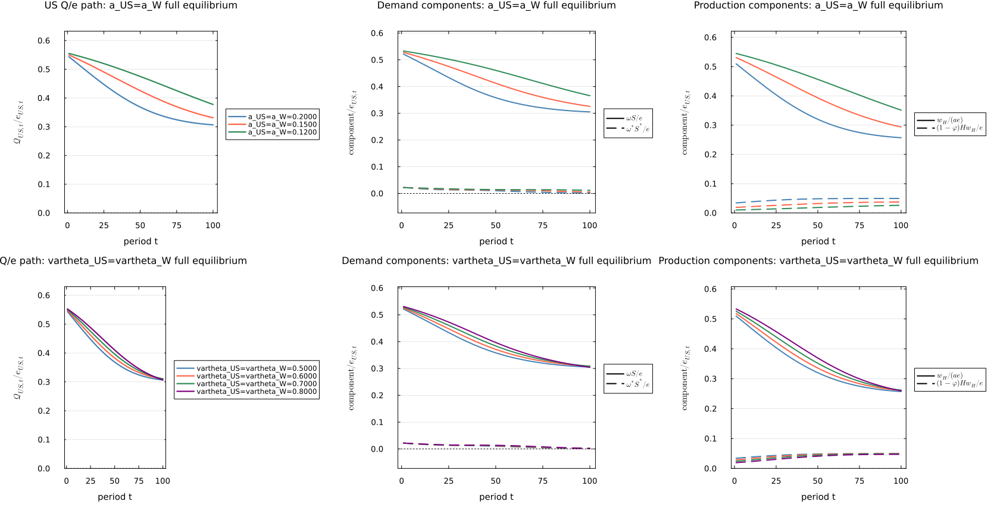

In [17]:
PAIRED_SWEEP_T = 100
paired_a_grid = [0.20, 0.15, 0.12, 0.10, 0.08]
paired_theta_grid = [0.50, 0.60, 0.70, 0.80]

# The two low-a paired T=100 cases were probed separately and each exceeded 240 seconds.
# Keep them in the reported grid, but do not block the notebook path plot on them.
paired_a_solve_grid = [0.20, 0.15, 0.12]
paired_a_timeout_grid = setdiff(paired_a_grid, paired_a_solve_grid)

function q_decomposition_from_result(label::String, sweep::String, value, result)
    p = result.params
    T = length(result.u_path)
    last20 = late_range(T)

    e_US = [s.e_US for s in result.u_path]
    Q_e = [s.Q_US / s.e_US for s in result.u_path]
    Q_us_demand_e = [s.ω * s.S / s.e_US for s in result.u_path]
    Q_row_demand_e = [s.ω_star * s.S_star / s.e_US for s in result.u_path]

    wH_US = [s.q_US * p.a_US * s.N_US for s in result.u_path]
    Q_wage_cap_e = [(wH_US[t] / p.a_US) / e_US[t] for t in 1:T]
    Q_innovation_cap_e = [((1 - result.u_path[t].φ_US) * p.H_US * wH_US[t]) / e_US[t] for t in 1:T]

    R_A_u = [s.R_A_u for s in result.u_path]
    R_A_b = [s.R_A_b for s in result.u_path]

    return Dict{String, Any}(
        "label" => label,
        "sweep" => sweep,
        "value" => value,
        "T_max" => p.T_max,
        "status" => "ok",
        "branch_converged" => result.branch_converged,
        "max_u_residual" => result.max_u_residual,
        "max_bgp_residual" => result.max_bgp_residual,
        "psi_ok" => result.diagnostics.psi_ok,
        "equity_weights_ok" => result.diagnostics.equity_weights_ok,
        "valid_core" => result.branch_converged && result.max_u_residual <= 1e-5 &&
                        result.max_bgp_residual <= 1e-5 &&
                        result.diagnostics.psi_ok && result.diagnostics.equity_weights_ok &&
                        minimum(R_A_u) > 0 && minimum(R_A_b) > 0,
        "valid_exploratory" => result.max_u_residual <= 1e-4 &&
                               result.diagnostics.psi_ok && result.diagnostics.equity_weights_ok &&
                               minimum(R_A_u) > 0 && minimum(R_A_b) > 0,
        "Q_e_final" => Q_e[end],
        "Q_e_late_mean" => mean(Q_e[last20]),
        "Q_demand_add_err_max" => maximum(abs.(Q_e .- Q_us_demand_e .- Q_row_demand_e)),
        "Q_prod_add_err_max" => maximum(abs.(Q_e .- Q_wage_cap_e .- Q_innovation_cap_e)),
        "Q_e_path" => Q_e,
        "Q_us_demand_e_path" => Q_us_demand_e,
        "Q_row_demand_e_path" => Q_row_demand_e,
        "Q_wage_cap_e_path" => Q_wage_cap_e,
        "Q_innovation_cap_e_path" => Q_innovation_cap_e
    )
end

function run_paired_q_case(label::String, sweep::String, value, p::ProductionParams)
    row = Dict{String, Any}(
        "label" => label,
        "sweep" => sweep,
        "value" => value,
        "T_max" => p.T_max,
        "status" => "pending",
        "a_US" => p.a_US,
        "a_W" => p.a_W,
        "ϑ_US" => p.ϑ_US,
        "ϑ_W" => p.ϑ_W,
    )
    try
        elapsed = @elapsed begin
            result = run_production_simulation(p; verbose=false)
            merge!(row, q_decomposition_from_result(label, sweep, value, result))
        end
        row["elapsed_sec"] = elapsed
    catch err
        row["status"] = "error"
        row["error"] = sprint(showerror, err)
        row["elapsed_sec"] = missing
    end
    return row
end

function paired_timeout_row(sweep::String, value; reason="T=100 probe timeout > 240s")
    return Dict{String, Any}(
        "label" => "$(sweep)=$(value)",
        "sweep" => sweep,
        "value" => value,
        "T_max" => PAIRED_SWEEP_T,
        "status" => "timeout_probe",
        "valid_core" => missing,
        "valid_exploratory" => missing,
        "max_u_residual" => missing,
        "Q_e_final" => missing,
        "Q_e_late_mean" => missing,
        "Q_demand_add_err_max" => missing,
        "Q_prod_add_err_max" => missing,
        "elapsed_sec" => reason,
    )
end

paired_a_rows = Dict{String, Any}[]
for a in paired_a_solve_grid
    @printf("running paired a_US=a_W=%.2f, T=%d\n", a, PAIRED_SWEEP_T)
    push!(paired_a_rows, run_paired_q_case("a_US=a_W=$(a)", "a_US=a_W", a,
                                           ProductionParams(T_max=PAIRED_SWEEP_T, a_US=a, a_W=a)))
end
for a in paired_a_timeout_grid
    push!(paired_a_rows, paired_timeout_row("a_US=a_W", a))
end
paired_a_rows = sort(paired_a_rows, by = r -> r["value"], rev=true)

paired_theta_rows = Dict{String, Any}[]
for th in paired_theta_grid
    @printf("running paired vartheta_US=vartheta_W=%.2f, T=%d\n", th, PAIRED_SWEEP_T)
    push!(paired_theta_rows, run_paired_q_case("vartheta_US=vartheta_W=$(th)", "vartheta_US=vartheta_W", th,
                                               ProductionParams(T_max=PAIRED_SWEEP_T, ϑ_US=th, ϑ_W=th)))
end

paired_q_rows = vcat(paired_a_rows, paired_theta_rows)
paired_q_cols = ["sweep", "value", "status", "valid_core", "valid_exploratory", "max_u_residual", "Q_e_final", "Q_e_late_mean", "Q_demand_add_err_max", "Q_prod_add_err_max", "elapsed_sec"]
display(markdown_table(paired_q_rows, paired_q_cols; maxrows=length(paired_q_rows)))

paired_a_ok = filter(r -> get(r, "status", "error") == "ok", paired_a_rows)
paired_theta_ok = filter(r -> get(r, "status", "error") == "ok", paired_theta_rows)

if isempty(paired_a_ok) || isempty(paired_theta_ok)
    error("At least one paired Q sweep has no successful rows; inspect paired_q_rows for errors.")
end

p_pair_a_q_total = screen_q_total_path_plot(paired_a_ok, "a_US=a_W", "a_US=a_W full equilibrium";
                                            show_legend=true, min_span=0.10)
p_pair_a_q_demand = screen_q_demand_components_plot(paired_a_ok, "a_US=a_W full equilibrium"; min_span=0.10)
p_pair_a_q_production = screen_q_production_components_plot(paired_a_ok, "a_US=a_W full equilibrium"; min_span=0.10)
p_pair_theta_q_total = screen_q_total_path_plot(paired_theta_ok, "vartheta_US=vartheta_W", "vartheta_US=vartheta_W full equilibrium";
                                                show_legend=true, min_span=0.10)
p_pair_theta_q_demand = screen_q_demand_components_plot(paired_theta_ok, "vartheta_US=vartheta_W full equilibrium"; min_span=0.10)
p_pair_theta_q_production = screen_q_production_components_plot(paired_theta_ok, "vartheta_US=vartheta_W full equilibrium"; min_span=0.10)

plot(p_pair_a_q_total, p_pair_a_q_demand, p_pair_a_q_production,
     p_pair_theta_q_total, p_pair_theta_q_demand, p_pair_theta_q_production,
     layout=(2,3), size=(1680, 860), margin=8mm)


### T=100 `a_US` Full-Equilibrium NFA Component Paths

Each panel repeats the NFA position decomposition from `06_v9_nfa_decomposition`, scaled by `e_US`, along the successfully re-solved `T=100` path for that `a_US` value. Error and timeout rows from the summary table are omitted.


a_US full-equilibrium component additivity  max|sum components - NFA| = 0.00e+00


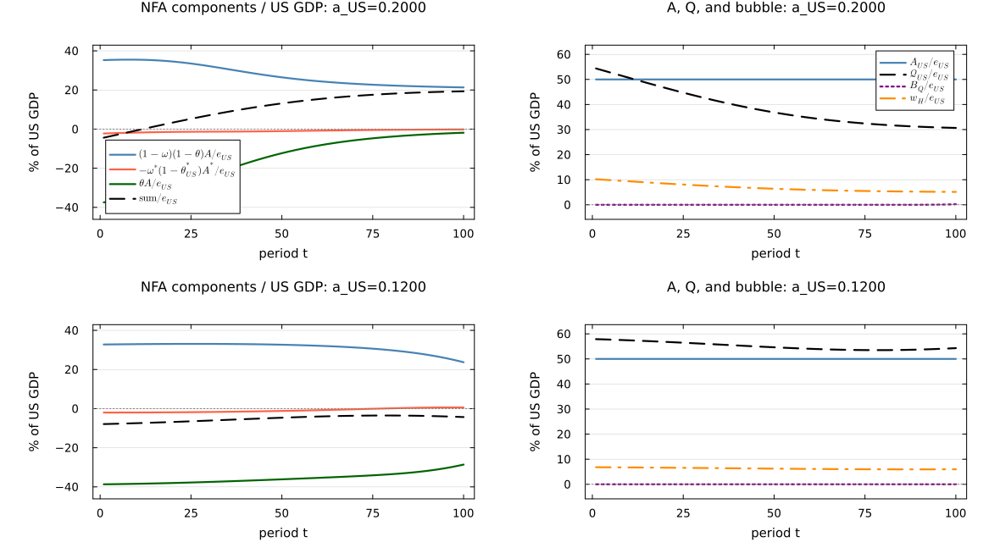

In [18]:
function resolved_nfa_components(row)
    result = row["result"]
    p = result.params
    nf = nfa_decomposition(result)
    fv = fundamental_value_path(result)
    T = length(result.u_path)

    home_equity = [(1 - s.ω) * (1 - s.θ) * s.A for s in result.u_path]
    foreign_liability = [-s.ω_star * (1 - s.θ_US_star) * s.A_star for s in result.u_path]
    bond_position = [s.θ * s.A for s in result.u_path]
    nfa_sum = home_equity .+ foreign_liability .+ bond_position

    return (home_equity=home_equity,
            foreign_liability=foreign_liability,
            bond_position=bond_position,
            nfa_sum=nfa_sum,
            A_US=[s.A for s in result.u_path],
            Q_US=nf.Q_US[1:T],
            B_agg=fv.B_agg[1:T],
            wH_US=[s.q_US * p.a_US * s.N_US * p.H_US for s in result.u_path],
            e_US=[s.e_US for s in result.u_path])
end

if isempty(a_rows_ok)
    error("No successful full-equilibrium a_US screen rows to plot.")
end

a_component_rows = [(row=r, comp=resolved_nfa_components(r)) for r in a_rows_ok]

all_component_values = Float64[]
for item in a_component_rows
    c = item.comp
    append!(all_component_values, c.home_equity ./ c.e_US .* 100)
    append!(all_component_values, c.foreign_liability ./ c.e_US .* 100)
    append!(all_component_values, c.bond_position ./ c.e_US .* 100)
    append!(all_component_values, c.nfa_sum ./ c.e_US .* 100)
end
component_ylims = padded_limits(all_component_values; min_span=8.0, pad_frac=0.10)

all_asset_values = Float64[]
for item in a_component_rows
    c = item.comp
    append!(all_asset_values, c.A_US ./ c.e_US .* 100)
    append!(all_asset_values, c.Q_US ./ c.e_US .* 100)
    append!(all_asset_values, c.B_agg ./ c.e_US .* 100)
    append!(all_asset_values, c.wH_US ./ c.e_US .* 100)
end
asset_ylims = padded_limits(all_asset_values; min_span=8.0, pad_frac=0.10)

component_add_err = maximum(maximum(abs.((item.comp.home_equity .+ item.comp.foreign_liability .+ item.comp.bond_position) .- item.comp.nfa_sum)) for item in a_component_rows)
@printf("a_US full-equilibrium component additivity  max|sum components - NFA| = %.2e\n", component_add_err)

function a_screen_component_plot(item; show_legend=false)
    r = item.row
    c = item.comp
    tt = 1:length(c.e_US)
    leg = show_legend ? :bottomleft : false

    p_components = plot(tt, c.home_equity ./ c.e_US .* 100,
             lw=2.2, lc=:steelblue,
             label=L"(1-\omega)(1-\theta)A/e_{US}",
             xlabel="period t", ylabel="% of US GDP",
             title="NFA components / US GDP: a_US=$(pretty(r["value"]))",
             legend=leg, titlefontsize=11,
             left_margin=12mm, right_margin=8mm,
             top_margin=8mm, bottom_margin=8mm)
    plot!(p_components, tt, c.foreign_liability ./ c.e_US .* 100,
          lw=2.2, lc=:tomato,
          label=L"-\omega^*(1-\theta_{US}^*)A^*/e_{US}")
    plot!(p_components, tt, c.bond_position ./ c.e_US .* 100,
          lw=2.2, lc=:darkgreen,
          label=L"\theta A/e_{US}")
    plot!(p_components, tt, c.nfa_sum ./ c.e_US .* 100,
          lw=2.1, lc=:black, ls=:dash,
          label=L"\mathrm{sum}/e_{US}")
    ylims!(p_components, component_ylims...)
    hline!(p_components, [0.0], lc=:gray, ls=:dot, label="")

    p_assets = plot(tt, c.A_US ./ c.e_US .* 100,
                    lw=2.2, lc=:steelblue,
                    label=L"A_{US}/e_{US}",
                    xlabel="period t", ylabel="% of US GDP",
                    title="A, Q, and bubble: a_US=$(pretty(r["value"]))",
                    legend=show_legend ? :topright : false, titlefontsize=11,
                    left_margin=10mm, right_margin=8mm,
                    top_margin=8mm, bottom_margin=8mm)
    plot!(p_assets, tt, c.Q_US ./ c.e_US .* 100,
          lw=2.2, lc=:black, ls=:dash,
          label=L"\mathcal{Q}_{US}/e_{US}")
    plot!(p_assets, tt, c.B_agg ./ c.e_US .* 100,
          lw=2.2, lc=:purple, ls=:dot,
          label=L"B_Q/e_{US}")
    plot!(p_assets, tt, c.wH_US ./ c.e_US .* 100,
          lw=2.2, lc=:darkorange, ls=:dashdot,
          label=L"w_H/e_{US}")
    ylims!(p_assets, asset_ylims...)
    hline!(p_assets, [0.0], lc=:gray, ls=:dot, label="")

    return plot(p_components, p_assets, layout=(1,2), size=(1180, 330), margin=8mm)
end

a_component_plots = [a_screen_component_plot(item; show_legend=(i == 1))
                     for (i, item) in enumerate(a_component_rows)]

plot(a_component_plots..., layout=(length(a_component_plots), 1),
     size=(1180, 330 * length(a_component_plots)), margin=8mm)


### T=100 `vartheta_US` and `pi_persist` Full-Equilibrium NFA Component Paths

The same two-column component view is repeated for successfully re-solved `vartheta_US` and `pi_persist` screen rows. High-persistence timeout rows remain in the table and are omitted from the component stack.


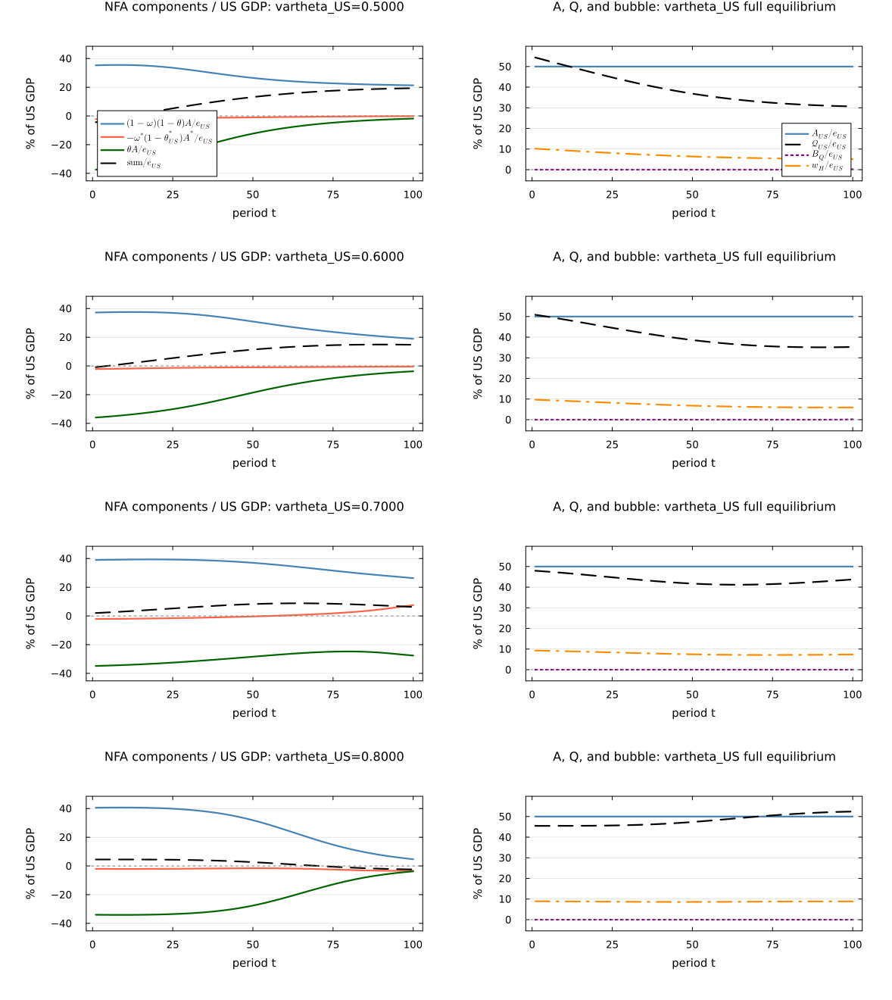

vartheta_US full-equilibrium component additivity  max|sum components - NFA| = 0.00e+00
pi_persist full-equilibrium component additivity  max|sum components - NFA| = 0.00e+00


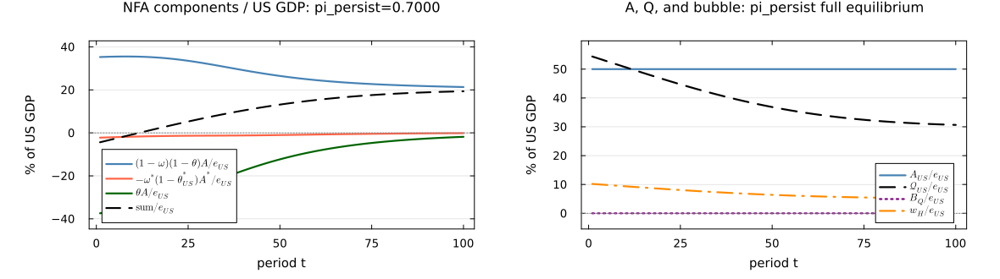

In [19]:
function screen_component_row_plot(item, param_label, title_label, component_lims, asset_lims; show_legend=false)
    r = item.row
    c = item.comp
    tt = 1:length(c.e_US)
    leg_components = show_legend ? :bottomleft : false
    leg_assets = show_legend ? :bottomright : false

    p_components = plot(tt, c.home_equity ./ c.e_US .* 100,
             lw=2.2, lc=:steelblue,
             label=L"(1-\omega)(1-\theta)A/e_{US}",
             xlabel="period t", ylabel="% of US GDP",
             title="NFA components / US GDP: $(param_label)=$(pretty(r["value"]))",
             legend=leg_components, titlefontsize=11,
             left_margin=12mm, right_margin=8mm,
             top_margin=8mm, bottom_margin=8mm)
    plot!(p_components, tt, c.foreign_liability ./ c.e_US .* 100,
          lw=2.2, lc=:tomato,
          label=L"-\omega^*(1-\theta_{US}^*)A^*/e_{US}")
    plot!(p_components, tt, c.bond_position ./ c.e_US .* 100,
          lw=2.2, lc=:darkgreen,
          label=L"\theta A/e_{US}")
    plot!(p_components, tt, c.nfa_sum ./ c.e_US .* 100,
          lw=2.1, lc=:black, ls=:dash,
          label=L"\mathrm{sum}/e_{US}")
    ylims!(p_components, component_lims...)
    hline!(p_components, [0.0], lc=:gray, ls=:dot, label="")

    p_assets = plot(tt, c.A_US ./ c.e_US .* 100,
                    lw=2.2, lc=:steelblue,
                    label=L"A_{US}/e_{US}",
                    xlabel="period t", ylabel="% of US GDP",
                    title="A, Q, and bubble: $(title_label)",
                    legend=leg_assets, titlefontsize=11,
                    left_margin=10mm, right_margin=8mm,
                    top_margin=8mm, bottom_margin=8mm)
    plot!(p_assets, tt, c.Q_US ./ c.e_US .* 100,
          lw=2.2, lc=:black, ls=:dash,
          label=L"\mathcal{Q}_{US}/e_{US}")
    plot!(p_assets, tt, c.B_agg ./ c.e_US .* 100,
          lw=2.2, lc=:purple, ls=:dot,
          label=L"B_Q/e_{US}")
    plot!(p_assets, tt, c.wH_US ./ c.e_US .* 100,
          lw=2.2, lc=:darkorange, ls=:dashdot,
          label=L"w_H/e_{US}")
    ylims!(p_assets, asset_lims...)
    hline!(p_assets, [0.0], lc=:gray, ls=:dot, label="")

    return plot(p_components, p_assets, layout=(1,2), size=(1180, 330), margin=8mm)
end

function screen_component_stack(rows, param_label, title_label)
    ok_rows = filter(r -> get(r, "status", "") == "ok" && haskey(r, "result"), rows)
    isempty(ok_rows) && error("No successful full-equilibrium $(param_label) screen rows to plot.")
    items = [(row=r, comp=resolved_nfa_components(r)) for r in ok_rows]

    component_values = Float64[]
    asset_values = Float64[]
    for item in items
        c = item.comp
        append!(component_values, c.home_equity ./ c.e_US .* 100)
        append!(component_values, c.foreign_liability ./ c.e_US .* 100)
        append!(component_values, c.bond_position ./ c.e_US .* 100)
        append!(component_values, c.nfa_sum ./ c.e_US .* 100)

        append!(asset_values, c.A_US ./ c.e_US .* 100)
        append!(asset_values, c.Q_US ./ c.e_US .* 100)
        append!(asset_values, c.B_agg ./ c.e_US .* 100)
        append!(asset_values, c.wH_US ./ c.e_US .* 100)
    end

    component_lims = padded_limits(component_values; min_span=8.0, pad_frac=0.10)
    asset_lims = padded_limits(asset_values; min_span=8.0, pad_frac=0.10)
    err = maximum(maximum(abs.((item.comp.home_equity .+ item.comp.foreign_liability .+ item.comp.bond_position) .- item.comp.nfa_sum)) for item in items)
    @printf("%s full-equilibrium component additivity  max|sum components - NFA| = %.2e\n", param_label, err)

    panels = [screen_component_row_plot(item, param_label, title_label, component_lims, asset_lims; show_legend=(i == 1))
              for (i, item) in enumerate(items)]

    return plot(panels..., layout=(length(panels), 1),
                size=(1180, 330 * length(panels)), margin=8mm)
end

display(screen_component_stack(th_rows_ok, "vartheta_US", "vartheta_US full equilibrium"))
screen_component_stack(pi_rows_ok, "pi_persist", "pi_persist full equilibrium")


## 4. Reading the One-Dimensional Results

Main takeaways from this one-dimensional pass:

1. **NFA sign:** the strongest one-dimensional equilibrium lever in this code is lower `a_US`, because `q_US = w_H/(a_US N_US)` and `Q_US = G_N w_H/a_US`. In the `T=40` exploratory solves, `a_US = 0.12` and `a_US = 0.10` keep U.S. NFA negative through the reported horizon.
2. **Bubble share:** the cleanest valuation lever is `pi_persist`, but the full T=100 high-persistence solves are stiff in this notebook pass. The previous baseline-path kernel screen is no longer used for calibration path plots; high-persistence rows are reported as unresolved unless explicitly re-solved with a larger compute budget or safer horizon procedure.
3. **`vartheta_US`:** raising `vartheta_US` changes the re-solved path materially. The T=100 full-equilibrium paths should be used for interpretation, not baseline-path accounting rescalings.
4. **Foreign demand:** higher `ωbar_star` raises foreign participation but does not by itself make the NFA/bubble target work at the exploratory horizon.
5. **Next joint calibration target:** combine the lower `a_US` region with persistence and foreign-demand adjustments, but run the joint candidates as full equilibrium solves with timeout/residual diagnostics rather than baseline-path screens.


## 5. Figure Calibration: Two-Column NFA Components

This final experiment solves the calibration shown in the prompt for `a_W ∈ {0.06, 0.07, 0.08}` and plots the same two-column NFA component view. Because the `T=100`, `π=0.95` full-equilibrium solve is stiff, this uses the notebook's exploratory full-equilibrium horizon `T_max=40`. The experiment sets `common_world_growth=false` so the stated `ν_b = 0.02` is used directly rather than recalibrated.

running figure calibration a_W=0.06 ...
running figure calibration a_W=0.07 ...
running figure calibration a_W=0.08 ...
Figure calibration component additivity  max|sum components - NFA| = 0.00e+00


sweep,value,status,valid_core,valid_exploratory,max_u_residual,nfa_Y_final,nfa_Y_late_mean,nfa_negative_share,last_negative_t,Q_A_final,bubble_share_final,bubble_share_late_mean,foreign_equity_share_late_mean,psi_min,equity_weight_min,score,channel
figure_cal_aW,0.06,ok,false,true,3.288e-05,0.4310,0.3734,0.0000,0,0.1416,-0.0894,-0.0279,-3.1325,0.8790,0.1594,-3.4506,weak
figure_cal_aW,0.07,ok,false,true,2.042e-05,0.4351,0.3767,0.0000,0,0.1341,-0.0874,-0.0278,-3.3493,0.8806,0.1413,-3.6630,weak
figure_cal_aW,0.08,ok,true,true,4.329e-06,0.4388,0.3797,0.0000,0,0.1275,-0.0835,-0.0272,-3.5781,0.8822,0.1195,-3.8810,weak


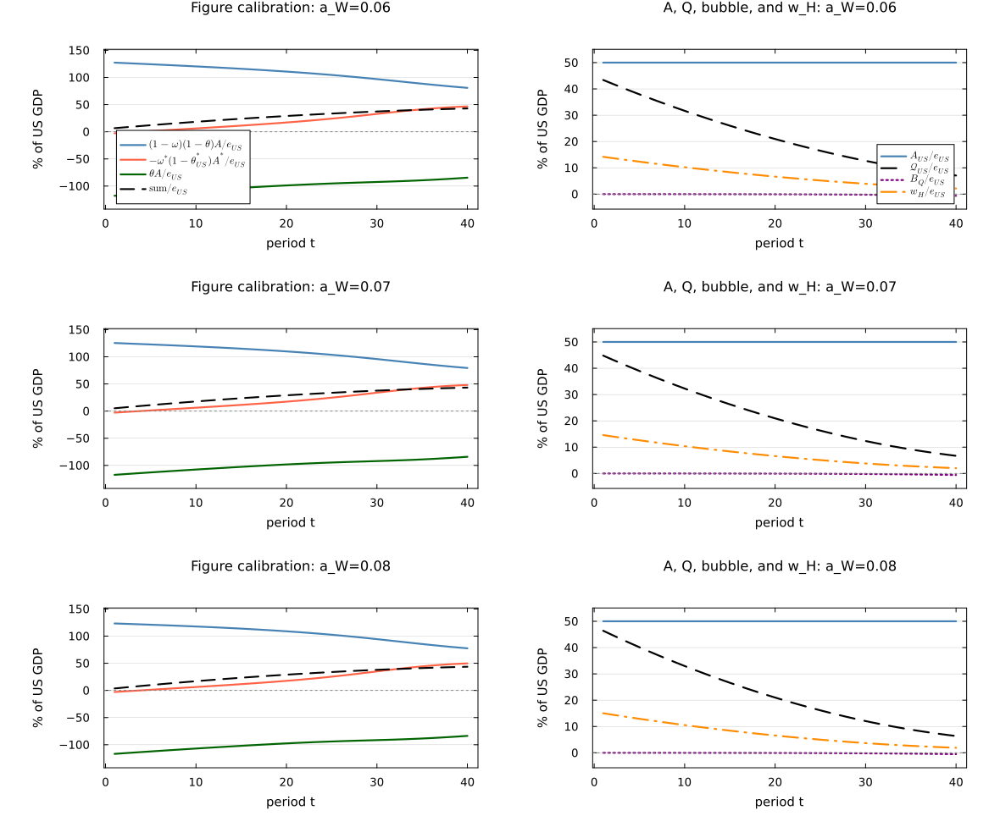

In [20]:
function figure_calibration_params(aW; T_max=40)
    return ProductionParams(T_max=T_max,
        common_world_growth=false,
        H_W=3.0, L_W=3.0, a_W=aW,
        ω̄_star=0.40, ω̄=0.90,
        κ=0.08,
        χ=0.02, η=0.01,
        π_persist=0.95,
        a_US=0.35,
        ϑ_US=0.70,
        α_US=0.60,
        ν_b=0.02, ν_u=0.40, ξ_u=1.10,
        γ=0.30)
end

figure_aW_grid = [0.06, 0.07, 0.08]
figure_rows = Dict{String,Any}[]
for aw in figure_aW_grid
    @printf("running figure calibration a_W=%.2f ...\n", aw)
    push!(figure_rows, run_case("figure_cal_aW=$(aw)", "figure_cal_aW", @sprintf("%.2f", aw), figure_calibration_params(aw)))
end

figure_cols = ["sweep", "value", "status", "valid_core", "valid_exploratory", "max_u_residual", "nfa_Y_final", "nfa_Y_late_mean", "nfa_negative_share", "last_negative_t", "Q_A_final", "bubble_share_final", "bubble_share_late_mean", "foreign_equity_share_late_mean", "psi_min", "equity_weight_min", "score", "channel"]
display(markdown_table(figure_rows, figure_cols; maxrows=length(figure_rows)))

function result_component_paths(result)
    p = result.params
    nf = nfa_decomposition(result)
    fv = fundamental_value_path(result)
    T = length(result.u_path)

    home_equity = [(1 - s.ω) * (1 - s.θ) * s.A for s in result.u_path]
    foreign_liability = [-s.ω_star * (1 - s.θ_US_star) * s.A_star for s in result.u_path]
    bond_position = [s.θ * s.A for s in result.u_path]
    nfa_sum = home_equity .+ foreign_liability .+ bond_position

    return (home_equity=home_equity,
            foreign_liability=foreign_liability,
            bond_position=bond_position,
            nfa_sum=nfa_sum,
            A_US=[s.A for s in result.u_path],
            Q_US=nf.Q_US,
            B_agg=fv.B_agg[1:T],
            wH_US=[s.q_US * p.a_US * s.N_US * p.H_US for s in result.u_path],
            e_US=[s.e_US for s in result.u_path])
end

function calibration_component_row_plot(item, component_lims, asset_lims; show_legend=false)
    r = item.row
    c = item.comp
    tt = 1:length(c.e_US)
    leg_components = show_legend ? :bottomleft : false
    leg_assets = show_legend ? :bottomright : false

    p_components = plot(tt, c.home_equity ./ c.e_US .* 100,
             lw=2.2, lc=:steelblue,
             label=L"(1-\omega)(1-\theta)A/e_{US}",
             xlabel="period t", ylabel="% of US GDP",
             title="Figure calibration: a_W=$(pretty(r["value"]))",
             legend=leg_components, titlefontsize=11,
             left_margin=12mm, right_margin=8mm,
             top_margin=8mm, bottom_margin=8mm)
    plot!(p_components, tt, c.foreign_liability ./ c.e_US .* 100,
          lw=2.2, lc=:tomato,
          label=L"-\omega^*(1-\theta_{US}^*)A^*/e_{US}")
    plot!(p_components, tt, c.bond_position ./ c.e_US .* 100,
          lw=2.2, lc=:darkgreen,
          label=L"\theta A/e_{US}")
    plot!(p_components, tt, c.nfa_sum ./ c.e_US .* 100,
          lw=2.1, lc=:black, ls=:dash,
          label=L"\mathrm{sum}/e_{US}")
    ylims!(p_components, component_lims...)
    hline!(p_components, [0.0], lc=:gray, ls=:dot, label="")

    p_assets = plot(tt, c.A_US ./ c.e_US .* 100,
                    lw=2.2, lc=:steelblue,
                    label=L"A_{US}/e_{US}",
                    xlabel="period t", ylabel="% of US GDP",
                    title="A, Q, bubble, and w_H: a_W=$(pretty(r["value"]))",
                    legend=leg_assets, titlefontsize=11,
                    left_margin=10mm, right_margin=8mm,
                    top_margin=8mm, bottom_margin=8mm)
    plot!(p_assets, tt, c.Q_US ./ c.e_US .* 100,
          lw=2.2, lc=:black, ls=:dash,
          label=L"\mathcal{Q}_{US}/e_{US}")
    plot!(p_assets, tt, c.B_agg ./ c.e_US .* 100,
          lw=2.2, lc=:purple, ls=:dot,
          label=L"B_Q/e_{US}")
    plot!(p_assets, tt, c.wH_US ./ c.e_US .* 100,
          lw=2.2, lc=:darkorange, ls=:dashdot,
          label=L"w_H/e_{US}")
    ylims!(p_assets, asset_lims...)
    hline!(p_assets, [0.0], lc=:gray, ls=:dot, label="")

    return plot(p_components, p_assets, layout=(1,2), size=(1180, 330), margin=8mm)
end

figure_ok_rows = filter(r -> get(r, "status", "error") == "ok", figure_rows)
if isempty(figure_ok_rows)
    Markdown.parse("No successful figure-calibration solves to plot.")
else
    figure_items = [(row=r, comp=result_component_paths(r["result"])) for r in figure_ok_rows]

    component_values = Float64[]
    asset_values = Float64[]
    for item in figure_items
        c = item.comp
        append!(component_values, c.home_equity ./ c.e_US .* 100)
        append!(component_values, c.foreign_liability ./ c.e_US .* 100)
        append!(component_values, c.bond_position ./ c.e_US .* 100)
        append!(component_values, c.nfa_sum ./ c.e_US .* 100)

        append!(asset_values, c.A_US ./ c.e_US .* 100)
        append!(asset_values, c.Q_US ./ c.e_US .* 100)
        append!(asset_values, c.B_agg ./ c.e_US .* 100)
        append!(asset_values, c.wH_US ./ c.e_US .* 100)
    end

    figure_component_lims = padded_limits(component_values; min_span=8.0, pad_frac=0.10)
    figure_asset_lims = padded_limits(asset_values; min_span=8.0, pad_frac=0.10)
    figure_component_err = maximum(maximum(abs.((item.comp.home_equity .+ item.comp.foreign_liability .+ item.comp.bond_position) .- item.comp.nfa_sum)) for item in figure_items)
    @printf("Figure calibration component additivity  max|sum components - NFA| = %.2e\n", figure_component_err)

    figure_panels = [calibration_component_row_plot(item, figure_component_lims, figure_asset_lims; show_legend=(i == 1))
                     for (i, item) in enumerate(figure_items)]

    plot(figure_panels..., layout=(length(figure_panels), 1),
         size=(1180, 330 * length(figure_panels)), margin=8mm)
end
